# Group S  
---

Group project for the "Social Network Analysis" course of LUISS University (a.y. 2024-2025).

---
Members:  

- 304011 Yasemin Ateş 
- 297061 Alessio Giannotti 
- 296881 Guia Ludovica Basso 
- 305561 Elina Yılmaz 
- 305031 Iuliia Glazkova 
---

**Professor:** Xavier Mathieu Raymond Venel

**Course Information:** https://www.luiss.it/cattedreonline/corso/TDS11/0/1DSL2BASE/2020

---

## WEEK 1

##### Representation of the Graph & Relevant Calculations

In [ ]:
"""
TASK

a) Pick a social network among the one proposed on luiss.learn

b) Implement it in Python.

c) Draw the graph.

d) Compute the number of nodes,edges, average degree and the density. Comment.

Be careful if the network that you have picked is directed or not.
"""

In [1]:
# Define file paths as needed
relationship_file = None
character_file = None

if not relationship_file:
    relationship_file = input("Enter Filepath (edges.csv): ")
if not character_file:
    character_file = input("Enter Filepath (nodes.csv): ")

In [2]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

def load_character_names(character_file):
    """
    Load character names from a CSV file into a dictionary with character IDs as keys and names as values.

    {
    '0': 'Aemon',
    '1': 'Grenn',
    '2': 'Samwell',   ---> for example...
    }
    """

    character_names = {} # see above

    with open(character_file, 'r') as f:

        next(f)  # skips header

        for line in f:
            # separately handle the comma-separated values...
            char_id, name = line.strip().split(',')  
            character_names[char_id] = name.strip('"')

    return character_names

def prepare_data(relationship_file, character_file):
    """
    Prepare the graph data from the relationship file, call it graph_data.

    {
    'Aemon': defaultdict(int, {'Grenn': 3, 'Samwell': 2}),
    'Grenn': defaultdict(int, {'Aemon': 3, 'Samwell': 1}),
    'Samwell': defaultdict(int, {'Aemon': 2, 'Grenn': 1}),    ---> for example...
    }

    of course, our nested dictionaries are much larger than 2.
    """

    character_names = load_character_names(character_file) # call previous dictionary of characters
    graph_data = defaultdict(lambda: defaultdict(int)) 

    with open(relationship_file, 'r') as f:

        next(f)  # skip the header
        for line in f:
             # separately handle the comma-separated values...
            fields = line.strip().split(',')
            char1_id = fields[0] # node1
            char2_id = fields[1] # node2
            relationship_strength = int(fields[2]) # weight of link node 1 and 2

            # add names to nodes
            char1 = character_names.get(char1_id)
            char2 = character_names.get(char2_id)

            if char1 and char2:
                graph_data[char1][char2] += relationship_strength

    return graph_data

# prepare graph 
graph_data = prepare_data(relationship_file, character_file)
G = nx.Graph()

# add nodes and edges to the graph G
for char1, relationships in graph_data.items():
    G.add_node(char1)

for char1, related_chars in graph_data.items():
    for char2, strength in related_chars.items():
        G.add_edge(char1, char2, weight=strength)

### Initial Representation with Regular Layout (kamada_kawai_layout)

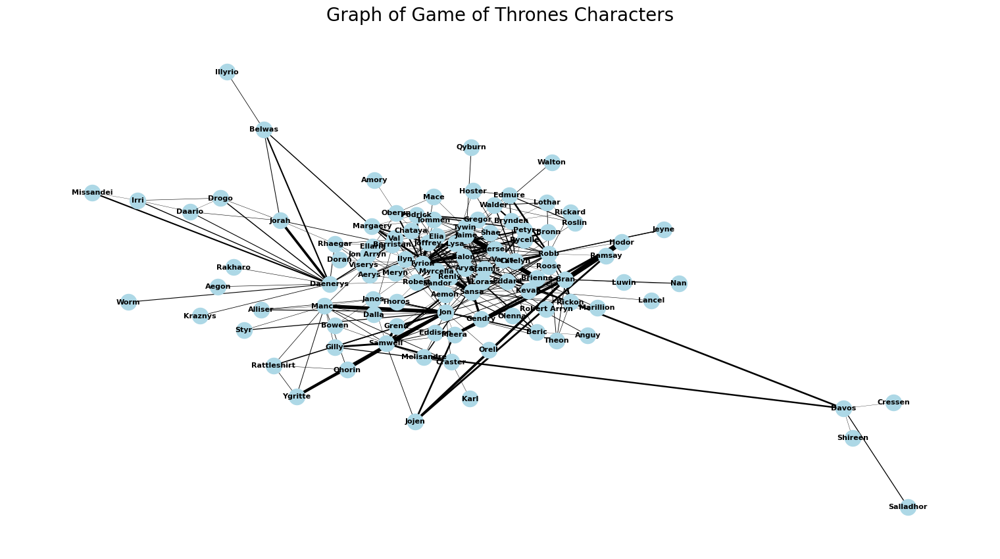

In [3]:
# calculate total relationship strength
total_strength = sum(d['weight'] for _, _, d in G.edges(data=True))

# calculate edge widths proportional to relationship strength
edge_widths = {(u, v): d['weight'] * 25 / total_strength * 10 for u, v, d in G.edges(data=True)}
# weight scaling has been tuned down from previous version for better readability...

# visualization
pos = nx.kamada_kawai_layout(G)
plt.figure(figsize=(15, 8))
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=300,
    node_color='lightblue',  # Uniform color for all nodes
    font_size=8,
    font_weight="bold",
    width=[edge_widths.get(edge, 0) for edge in G.edges()]
)

plt.title("Graph of Game of Thrones Characters", fontsize=20)
plt.show()

### Improved Visualization Using "spring_layout"

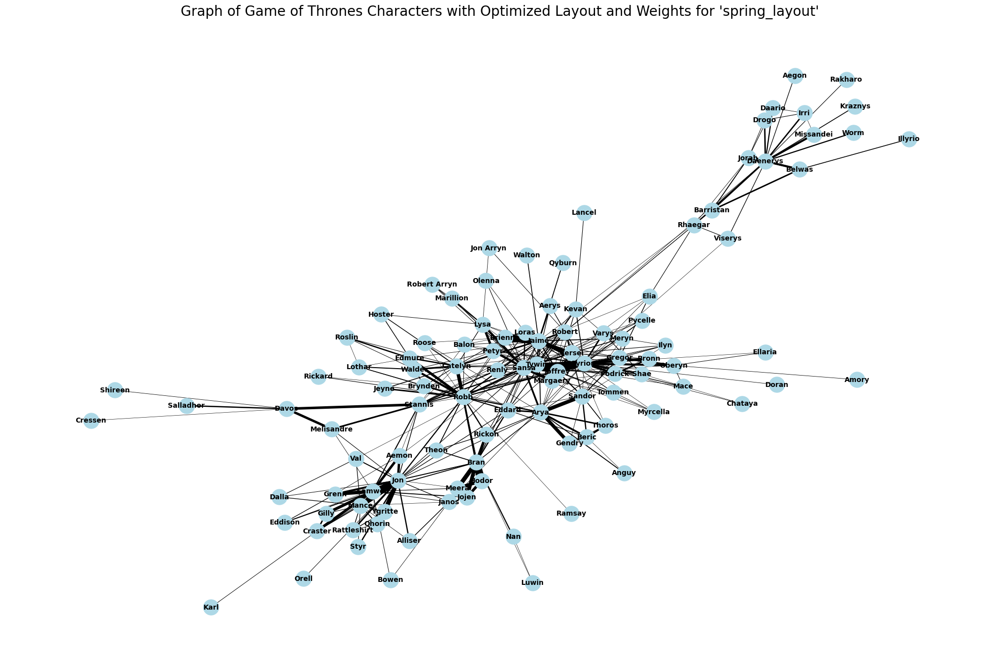

In [4]:
# calculate total relationship strength
total_strength = sum(d['weight'] for _, _, d in G.edges(data=True))

# calculate edge widths proportional to relationship strength
edge_widths = {(u, v): d['weight'] * 50 / total_strength * 10 for u, v, d in G.edges(data=True)}
# weight scaling has been tuned down from previous version for better readability...

# Spring layout for node positioning, adjusted for weights
pos = nx.spring_layout(G, k=0.1, iterations=1000, scale=2, seed=111)

# visualization
plt.figure(figsize=(20, 13))  # larger plot size
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=500,  
    node_color='lightblue',
    font_size=10, 
    font_weight="bold",
    width=[edge_widths.get(edge, 0) for edge in G.edges()]  # use edge_widths here
)

plt.title("Graph of Game of Thrones Characters with Optimized Layout and Weights for 'spring_layout'", fontsize=20)
plt.show()

### Improved Visualization Using "circular_layout"

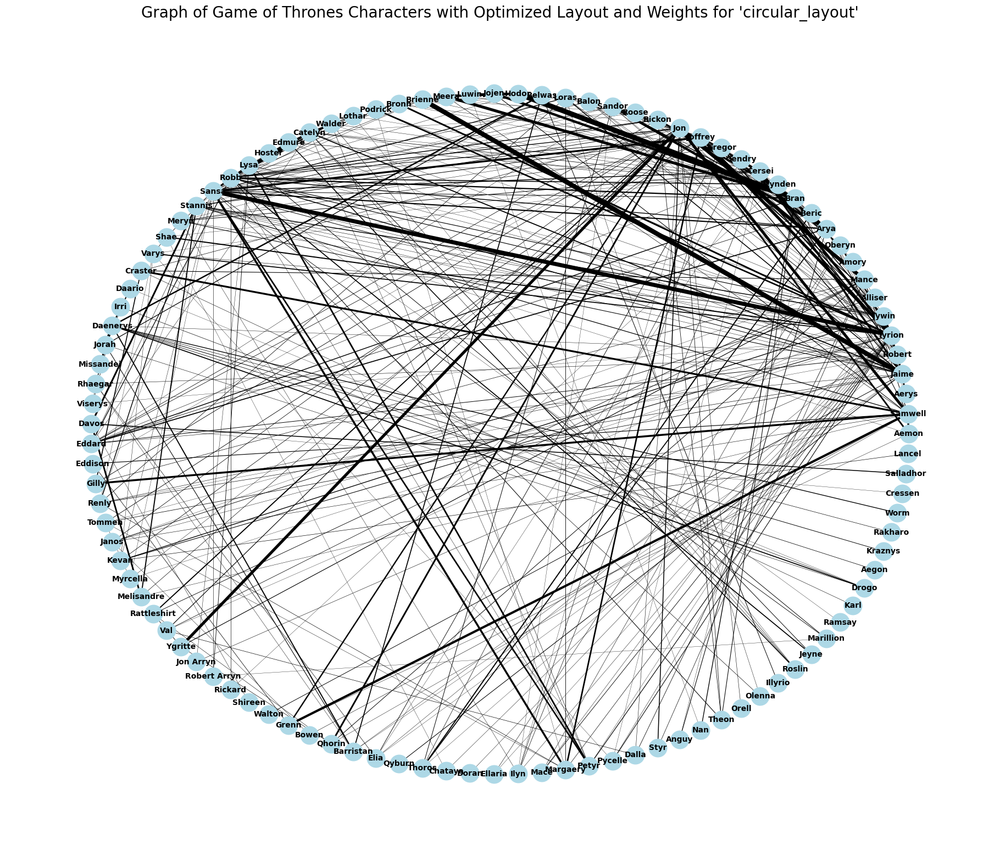

In [5]:
# Calculate total relationship strength
total_strength = sum(d['weight'] for _, _, d in G.edges(data=True))

# Calculate edge widths proportional to relationship strength
edge_widths = {(u, v): d['weight'] * 30 / total_strength * 10 for u, v, d in G.edges(data=True)}

# Spring layout for node positioning, adjusted for weights
pos = nx.circular_layout(G, scale=1, center=None, dim=2)

# visualization
plt.figure(figsize=(18, 15))  # larger plot size than above due to difference in layout
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=550,  
    node_color='lightblue',
    font_size=10, 
    font_weight="bold",
    width=[edge_widths.get(edge, 0) for edge in G.edges()]  # use edge_widths here
)

plt.title("Graph of Game of Thrones Characters with Optimized Layout and Weights for 'circular_layout'", fontsize=20)
plt.show()

In [6]:
# calculate and print graph statistics

num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
average_degree = sum(dict(G.degree()).values()) / num_nodes if num_nodes > 0 else 0 
density = nx.density(G)

print(f"{'Graph Statistics':^30}")
print(f"{'-'*28}")
print(f"{'Number of nodes':<20}: {num_nodes}")
print(f"{'Number of edges':<20}: {num_edges}")
print(f"{'Average degree':<20}: {average_degree:.2f}")
print(f"{'Density':<20}: {density:.4f}")

       Graph Statistics       
----------------------------
Number of nodes     : 107
Number of edges     : 352
Average degree      : 6.58
Density             : 0.0621


##### Based on the computed graph statistics for the Game of Thrones character coappearance network, we can deduce the following:

### Number of Nodes: 107
•  ⁠*Interpretation*: There are 107 unique characters represented in the network. The graph captures a substantial portion of the characters from the book "A Storm of Swords".

### Number of Edges: 352
•⁠  ⁠*Interpretation*: There are 352 relationships or coappearances recorded between these characters. This indicates that while there are many interactions, not every pair of characters has coappeared within 15 words of each other. Much like a real social network, our network is quite sparse.

### Average Degree: 6.58
•⁠  ⁠*Interpretation*: On average, each character is connected to approximately 6.58 other characters. This implies that, on average, each character is involved in around 6 to 7 coappearances with different characters. This is a moderate level of connectivity, showing that characters generally interact with several others, but not all characters are connected to all others.

### Density: 0.0621
•⁠  ⁠*Interpretation*: The density of 0.0621 indicates that the network is relatively sparse. This means that the actual number of edges is much lower compared to the maximum possible number of edges in a fully connected network of 107 nodes. In a dense network, density would be closer to 1, where every possible edge is present. A lower density value suggests that there are many potential connections that do not exist, reflecting a network where many characters are not directly connected to each other.

### Overall Deduction:
1.⁠ ⁠*Sparse Network*: The low density indicates that the character network is sparse. Many potential connections between characters are missing, meaning not all characters are directly connected.
  
2.⁠ ⁠*Moderate Connectivity*: The average degree suggests that while characters are reasonably connected (with an average of 6.58 connections), the network is not extremely interconnected. This is consistent with the sparse density.

3.⁠ ⁠*Character Interaction*: The number of edges shows that there are significant interactions among characters, but not an overwhelming number. This suggests a rich but selective network of interactions.

## WEEK 2

##### The Largest Component and Transitivity, Built-in and Manual Calculations

In [ ]:
"""
TASK

While considering the largest component of your network. Depending on what you prefer/seems
more relevant in your graph,

a) Compute Average distance and Diameter,

b) Improve the function computing the inverse distance function. (not using the in-build function shortest path)

Or

a’) Compute Average clustering and Transitivity number,

b’) Implement a function computing the transitivity using basic function of networkx
"""

For a Game of Thrones character network, *Option 2 (Clustering and Transitivity*) was considered more informative
because the series revolves around group dynamics (e.g., alliances between houses, families, factions). 
It can help you uncover patterns in how characters cluster together into social groups, 
reflecting the underlying political or social structures in the story.

In [7]:
# FIRST WITH BUILT-IN FUNCTIONS

# extract the largest connected component
largest_cc = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(largest_cc)

# compute average clustering
average_clustering = nx.average_clustering(subgraph)

# compute transitivity (global clustering coefficient)
transitivity = nx.transitivity(subgraph)

# print the results
print(f"{'Graph Analysis':^40}")
print(f"{'-'*62}")
print(f"{'Average Clustering Coefficient':<50}: {average_clustering:.4f}")
print(f"{'Transitivity (Global Clustering Coefficient)':<50}: {transitivity:.4f}")
print(f"{'Largest Connected Component (size)':<50}: {len(largest_cc)} nodes")

import pandas as pd

lcc_nodes = list(largest_cc)[:5]
df_lcc = pd.DataFrame(lcc_nodes, columns=["-Node-"])

# display the first 5 nodes in the largest connected component
print(f"\n\n{'First 5 Nodes in Largest Connected Component':^50}")
print("-" * 50)
print(df_lcc)
print("...")

             Graph Analysis             
--------------------------------------------------------------
Average Clustering Coefficient                    : 0.5514
Transitivity (Global Clustering Coefficient)      : 0.3287
Largest Connected Component (size)                : 107 nodes


   First 5 Nodes in Largest Connected Component   
--------------------------------------------------
      -Node-
0  Barristan
1    Rhaegar
2      Bronn
3     Daario
4      Roose
...


In [8]:
# THEN WITH MANUAL CALCULATIONS THROUGH FUNCTIONS (M)

def count_triangles(graph):
    """
    Count the number of triangles in the graph.
    A triangle is a set of three nodes where each node is connected to the other two.
    """
    triangles = 0
    for node in graph:
        neighbors = set(graph.neighbors(node))
        for neighbor in neighbors:
            if neighbor > node:  # Only consider neighbors that are greater than the current node
                mutual_neighbors = neighbors.intersection(graph.neighbors(neighbor))
                # Only count mutual neighbors that are greater than the neighbor (to avoid double-counting)
                triangles += len([n for n in mutual_neighbors if n > neighbor])
    
    return triangles


def count_triplets(graph):
    """
    Count the number of connected triplets in the graph.
    A triplet is a set of three nodes where two nodes are connected to a common third node.
    """
    triplets = 0
    for node in graph:
        neighbors = list(graph.neighbors(node))
        k = len(neighbors)
        if k >= 2:
            # the number of possible triplets is combination(k, 2) = k * (k-1) / 2
            triplets += (k * (k - 1)) // 2
    
    return triplets

def compute_transitivity(graph):
    """
    Compute the transitivity (global clustering coefficient) manually.
    """
    largest_cc = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_cc)
    
    triangles = count_triangles(subgraph)
    triplets = count_triplets(subgraph)
    
    transitivity = (3 * triangles) / triplets if triplets > 0 else 0
    return transitivity

# calculate transitivity for the largest component (manually)
transitivity_custom = compute_transitivity(G)

# structuring the output for better readability
print(f"{'Transitivity Calculation Analysis (M)':^40}")
print(f"{'-'*48}")
print(f"{'Transitivity (computed with networkx)':<40}: {transitivity:.4f}")
print(f"{'Transitivity (computed manually)':<40}: {transitivity_custom:.4f}")

print("\nObserve that the same value holds for both built-in and manual functions.")

 Transitivity Calculation Analysis (M)  
------------------------------------------------
Transitivity (computed with networkx)   : 0.3287
Transitivity (computed manually)        : 0.3287

Observe that the same value holds for both built-in and manual functions.


## WEEK 3

The calculation of the Betweennes Centrality, Built-in and Manual Calculations (For Comparison)


In [ ]:
"""
TASK

Depending on what seems more relevant in your graph, pick one of the following local notions

Decay centrality
Betweeness centrality
Closeness centrality
Clustering
Any other notions that you invent
1) Provide a code computing the given centrality using basic functions of networkx (you are not allowed to
use directly nx."what you want").

2) Discuss why you picked this measure and who is the most central in your network based on your
choice.

3) Provide the cumulative distribution for this centrality and give a graphical representation of your graph
(log-log, log or normal representation as you think it is more relevant).
"""

For a Game of Thrones character network, a measurement of betweennes centrality was chosen as it identifies characters who act as key intermediaries, connecting different groups within the network. Characters with high betweenness, like Jon and VaRobertrys, play pivotal roles in facilitating alliances and influencing political outcomes, serving as crucial bridges between competing factions.

In [9]:
# BUILT-IN CALCULATION (BI)

import networkx as nx

betweenness_BI = nx.betweenness_centrality(G, normalized=True)

# sorted the betweenness centrality values in descending order and printed the top 5
top_5_betweenness_BI = sorted(betweenness_BI.items(), key=lambda x: x[1], reverse=True)[:5]

#displayed the top 5 nodes with the highest value 
# print the headers for the betweenness centrality (BI)
print(f"{'Character':<15} {'Betweenness Centrality (BI)':>10}")
print("-" * 43)

# iterate through the top 5 nodes with the highest betweenness centrality
for character, centrality in top_5_betweenness_BI:
    # display each node and its centrality with 6 decimal places
    print(f"{character:<23} {centrality:.6f}")


Character       Betweenness Centrality (BI)
-------------------------------------------
Jon                     0.229965
Robert                  0.209452
Tyrion                  0.197913
Daenerys                0.157203
Robb                    0.126964


In [10]:
# MANUAL CALCULATION (M)

def compute_betweenness_centrality(G):
    betweenness_M = {node: 0 for node in G.nodes()}

    # for each pair of nodes (s, t)
    for s in G.nodes():
        # perform BFS from source node "s" to find all shortest paths
        paths = {node: [] for node in G.nodes()}
        shortest_paths = {node: float('inf') for node in G.nodes()}
        shortest_paths[s] = 0
        paths[s] = [[s]]
        queue = [s]

        while queue:
            node = queue.pop(0)
            for neighbor in G.neighbors(node):
                if shortest_paths[neighbor] == float('inf'):  # if not visited
                    shortest_paths[neighbor] = shortest_paths[node] + 1
                    paths[neighbor] = [path + [neighbor] for path in paths[node]]
                    queue.append(neighbor)
                elif shortest_paths[neighbor] == shortest_paths[node] + 1:
                    paths[neighbor].extend([path + [neighbor] for path in paths[node]])

        # count the number of times each node appears on the shortest paths
        for t in G.nodes():
            if s != t:
                for path in paths[t]:
                    for node in path[1:-1]:  # nodes on the path excluding s and t
                        betweenness_M[node] += 1 / len(paths[t])

    # normalize the betweenness
    normalization_factor = (len(G.nodes()) - 1) * (len(G.nodes()) - 2)
    for node in betweenness_M:
        betweenness_M[node] /= normalization_factor

    return betweenness_M

# calculate betweenness centrality
betweenness_centrality_M = compute_betweenness_centrality(G)

# sort the betweenness centrality in descending order and print the top 5 values
top_5_betweenness_M = sorted(betweenness_centrality_M.items(), key=lambda item: item[1], reverse=True)[:5]

print(f"{'Character':<15} {'Betweenness Centrality (BI)':>30} {'Betweenness Centrality (M)':>30}")
print("-" * 77)

# iterate through the top 5 nodes for both built-in and manual centrality
for (character_BI, centrality_BI), (character_M, centrality_M) in zip(top_5_betweenness_BI, top_5_betweenness_M):
    # Use Python's format string to limit decimal places to 6 without rounding
    print(f"{character_BI:<23} {centrality_BI:<35.6f} {centrality_M:<30.6f}")

print("\nObserve that the same values hold for both built-in and manual functions.")

Character          Betweenness Centrality (BI)     Betweenness Centrality (M)
-----------------------------------------------------------------------------
Jon                     0.229965                            0.229965                      
Robert                  0.209452                            0.209452                      
Tyrion                  0.197913                            0.197913                      
Daenerys                0.157203                            0.157203                      
Robb                    0.126964                            0.126964                      

Observe that the same values hold for both built-in and manual functions.


These are the most (relatively) "important" characters, and Jon, a.k.a Jon Snow is the most "central".
It can be observed that the values are correctly calculated when the BI (Built-in) and M (Manual)values are compared.

##### Cumulative Distribution - Built-in and Manual Calculations compared

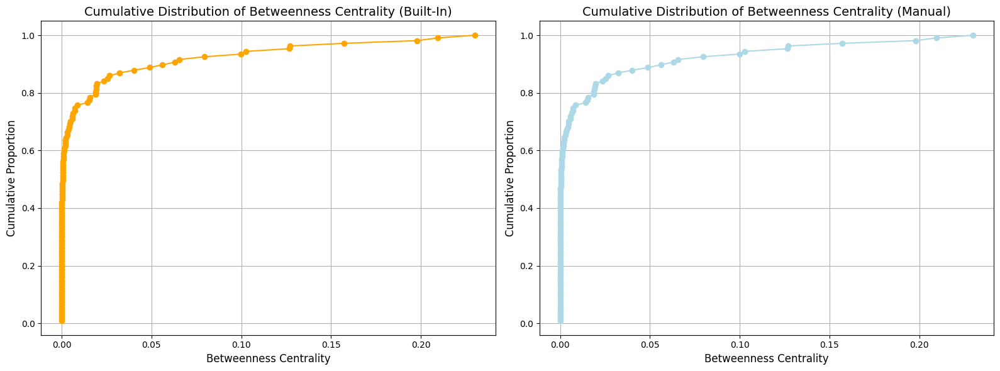

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# listed the betweenness centrality values (BI) 
betweenness_values_BI = list(betweenness_BI.values())

# calculated the cumulative distribution (BI)
sorted_betweenness_BI = np.sort(betweenness_values_BI)
cumulative_distribution_BI = np.arange(1, len(sorted_betweenness_BI) + 1) / len(sorted_betweenness_BI)

# betweenness_M is calculated by calling the function (M)
betweenness_M = compute_betweenness_centrality(G)

# listed the betweenness centrality values (M)
betweenness_values_M = list(betweenness_M.values())

# calculated the cumulative distribution (M)
sorted_betweenness_M = np.sort(betweenness_values_M)
cumulative_distribution_M = np.arange(1, len(sorted_betweenness_M) + 1) / len(sorted_betweenness_M)

# create subplots with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# plot Built-In betweenness bentrality
axes[0].plot(sorted_betweenness_BI, cumulative_distribution_BI, marker='o', linestyle='-', color='orange')
axes[0].set_title('Cumulative Distribution of Betweenness Centrality (Built-In)', fontsize=14)
axes[0].set_xlabel('Betweenness Centrality', fontsize=12)
axes[0].set_ylabel('Cumulative Proportion', fontsize=12)
axes[0].grid(True)

# plot Manual betweenness centrality
axes[1].plot(sorted_betweenness_M, cumulative_distribution_M, marker='o', linestyle='-', color='lightblue')
axes[1].set_title('Cumulative Distribution of Betweenness Centrality (Manual)', fontsize=14)
axes[1].set_xlabel('Betweenness Centrality', fontsize=12)
axes[1].set_ylabel('Cumulative Proportion', fontsize=12)
axes[1].grid(True)

# display the plots side by side
plt.tight_layout()
plt.show()

A normal cumulative distribution is ideal for this specific measure of betweenness centrality. It clearly shows how centrality values accumulate across nodes. It effectively displays the skewed distribution without distorting the data, making it easier to compare the built-in and manual calculations. 

##### This distribution suggests that most of the characters have relatively *low betweenness centrality*, with only a few playing significant intermediary roles. 

## WEEK 5

In [ ]:
"""
TASK

PART 1: PAGERANK

1) Run build-in pagerank with parameter alpha=0.15 (alpha of the slides). Be careful, there is a trap. Check documentation of networkx.

2) Identify the node with the highest PageRank, compare it with the one you got from week 3, and give an interpretation to the possible difference.

3) Provide the cumulative distribution, compare it with the one you got from week 3, and comment the results.

Hint: treat weighted graphs as unweighted & links in undirected graphs as doubly directed (each undirected link becomes a directed link in both directions
Additionally, make sure you run the PageRank algorithm on a connected graph.
"""

For this week's task (Part 1) we have to find PageRank for all characters, the character with the highest page rank and cumulative distribution. Then we have to compare the most connected component from week 3 to the character with highest PageRank and the various cumulative distributions from week 3 to the one from PageRank

In [12]:
import networkx as nx
import matplotlib.pyplot as plt

# Page-rank using the build-in function with parameter alpha=0.15
# one caviate: alpha in nx.pagerank is 1-alpha in the slides so alpha = 0.85 (to get an alpha = 0.15 as in the slides)

pr = nx.pagerank(G,alpha=0.85) # returns a dictionary

# separately save the values of the dictionary
pr_values = pr.values()

# next we identify the node with highest value of PageRank and later compare it with week 3 results for centrality
value_max = max(pr_values)
index_max = list(pr_values).index(value_max) # index of the highest valued PageRank
list_of_names=list(G.nodes())
name_max = list_of_names[index_max]

print('The node with the highest PageRank is ' + name_max + ' with PageRank value: ' + str(round(value_max, 4))) #round to make it look better

The node with the highest PageRank is Tyrion with PageRank value: 0.0554


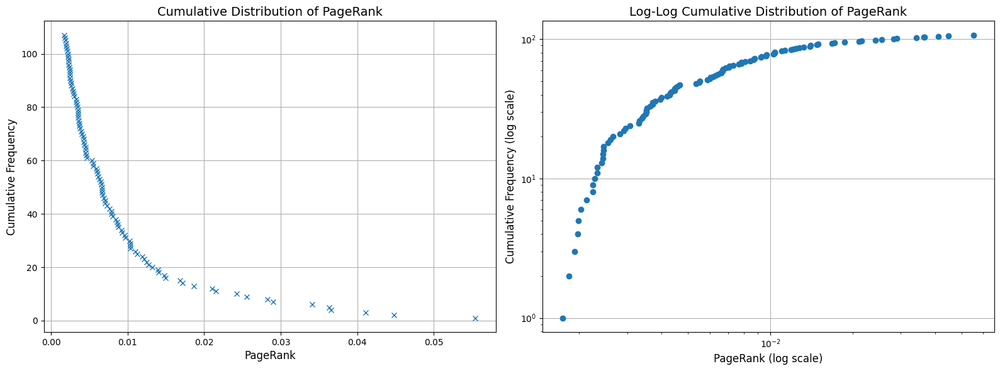

In [13]:
# cumulative distribution for the PageRank (both standard and log scale)
# Cumulative Distribution
# prepare data for cumulative distribution
pagerank_centralities=list(pr.values())
list_values=list(set(pagerank_centralities)) # get the list of values without repetition
list_values.sort() # sort them in increasing order
cdf_x=list_values # these are the values where the cdf change

cdf_y=[] # list of y-axis
for x in cdf_x: # check each value
    y=sum(test>=x for test in pagerank_centralities) # count how many element in data_centralities are above it
    cdf_y.append(y) # add it to the list

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# plot CDF on the first subplot
axes[0].plot(cdf_x, cdf_y, "x")
axes[0].set_title("Cumulative Distribution of PageRank", fontsize=14)
axes[0].set_xlabel("PageRank", fontsize=12)
axes[0].set_ylabel("Cumulative Frequency", fontsize=12)
axes[0].grid(True)

# plot CDF on a log-log scale on the second subplot
axes[1].loglog(sorted(pagerank_centralities), range(1, len(pagerank_centralities) + 1), marker='o', linestyle='None')
axes[1].set_title("Log-Log Cumulative Distribution of PageRank", fontsize=14)
axes[1].set_xlabel("PageRank (log scale)", fontsize=12)
axes[1].set_ylabel("Cumulative Frequency (log scale)", fontsize=12)
axes[1].grid(True)

# display the plots side by side
plt.tight_layout() 
plt.show()

### Centrality
To remember, the most central character based on betweenness centrality was Jon, but based PageRank, it is Tyrion.

*Interpretation*: This likely because, while Jon is associated with a lot of different characters, Tyrion is associated with the most influencial characters. 



#### Tyrion (PageRank): 

Has a PageRank of 0.0554, indicating he's connected to important nodes, but his overall influence might be lower compared to others.


#### Jon (Betweenness Centrality): 

Has the highest betweenness centrality (0.2299), meaning he serves as a crucial bridge between different parts of the network, but his immediate connections may not be as influential.


#### Key Difference:

Tyrion's high PageRank reflects his connection to influential nodes, while Jon's high betweenness centrality shows his key role in connecting various groups, regardless of his neighbors' influence.

### Cumulative Distribution

The cumulative distribution of Betweenness Centrality and PageRank are very similar in shape. But they differ in where most of the values are concentrated. For Betweenness that is right at the begining in the sharpest peak, at the lower end, near the beginning of the distribution. While for PageRank, they're spread more evenly around the center of the range. 
*Interpretation*: This implies that in betweenness centrality, most nodes are not key intermediaries, while the Pagerank is spread much more uniformly in the netwerk

## Part 2 Week 5:
The second part of week 5 task was to program our own function computing k-shell and k+1 core for all possible value of k and plot the k+1-core for an adequate choice of k. 

In [ ]:
"""
TASK

PART 2 : CORE

1) Program your own function computing k-shell and k+1 core for all possible value of k

2) Plot the k+1-core for an adequate choice of k
"""


Core nodes of 4-core:
====================================================================================================================================================== === === === = = = = = = = = =
Grenn, Aerys, Oberyn, Gendry, Roose, Hodor, Jojen, Theon, Bronn, Roslin, Pycelle, Shae, Craster, Daario, Drogo, Gilly, Janos, Myrcella, Rattleshirt, Val, Ygritte, Aemon, Mance, Beric, Rickon, Thoros, Barristan, Meera, Podrick, Lothar, Elia, Varys, Daenerys, Jorah, Rhaegar, Tommen, Kevan, Qhorin, Samwell, Brynden, Balon, Brienne, Walder, Edmure, Lysa, Ilyn, Margaery, Bran, Jon, Loras, Petyr, Meryn, Renly, Tywin, Gregor, Sandor, Catelyn, Stannis, Eddard, Jaime, Robert, Tyrion, Arya, Cersei, Joffrey, Robb, Sansa
====================================================================================================================================================== === === === = = = = = = = = =
Scroll to view...


K-shell Decomposition:
Level 1: Amory, Illyrio, Karl, Aegon, Kraznys, Rakharo, W

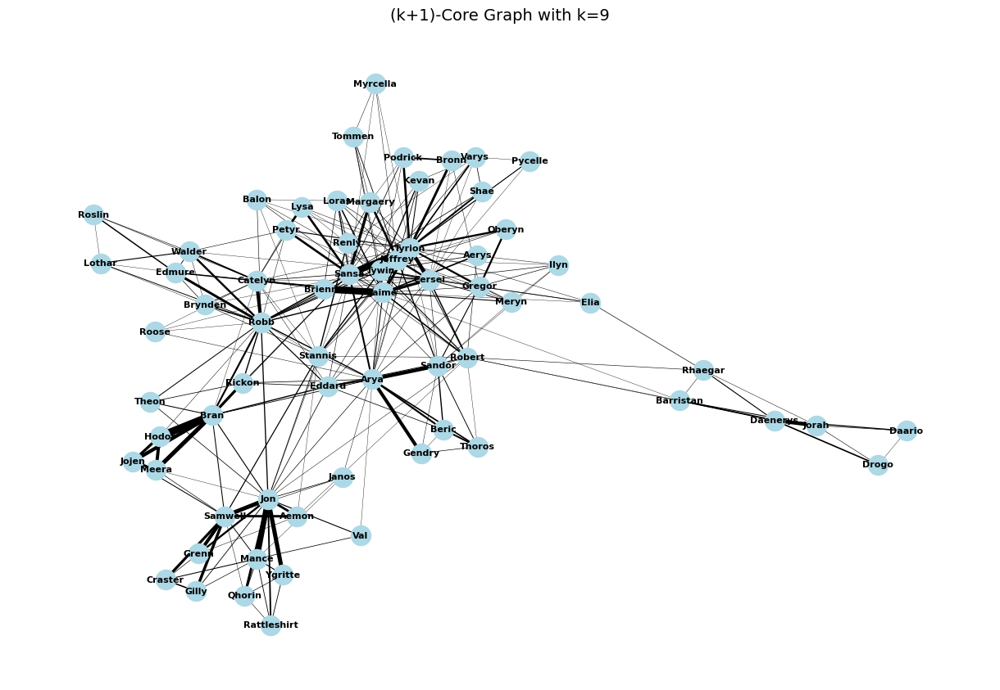

In [14]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

def exist_relation(char_file, edge_file):
    """
    Load character names from a CSV file into a dictionary with character IDs as keys and a list of their neighbours as values.
    """
    character_relations = {}
    with open(char_file, 'r') as f:
        next(f)  

        for line in f:
            char_id = line.strip().split(',')[0]  # get the first value as a string, not a list
            character_relations[char_id] = []  # initialize with an empty list
            
    with open(edge_file, 'r') as f:
        next(f)  
        for line in f:
            char1_id, char2_id = line.strip().split(',')[:2]
            
            if char1_id in character_relations:
                character_relations[char1_id].append(char2_id)
            if char2_id in character_relations:
                character_relations[char2_id].append(char1_id)
    
    return character_relations

def k_shell_function(neighbour_dict): 
    """
    Finds the k-shells of a dictionary and returns a dictionary of the n-shell where the k is the key and the k-shell list are the values
    """
    k_shell = {}
    k = 0
    max_neighbours = max(len(neighbour_dict[i]) for i in neighbour_dict)
    
    temp_neighbour_dict = {node: set(neighbours) for node, neighbours in neighbour_dict.items()}

    while temp_neighbour_dict:
        k_shell[k] = [] 

        nodes_to_remove = []
        for node, neighbours in temp_neighbour_dict.items():
            if len(neighbours) <= k:
                nodes_to_remove.append(node)

        for node in nodes_to_remove:
            k_shell[k].append(node)
            for neighbor in temp_neighbour_dict[node]:
                temp_neighbour_dict[neighbor].discard(node)
            del temp_neighbour_dict[node]

        if not k_shell[k]:
            del k_shell[k]
        k += 1

    return k_shell

def prepare_core_graph_data(relationship_file, character_file, core_nodes):
    core_graph_data = defaultdict(lambda: defaultdict(int))

    with open(relationship_file, 'r') as f:
        next(f) 
        for line in f:
            char1_id, char2_id, strength = line.strip().split(',')
            strength = int(strength)

            # Only include edges where both characters are in core_nodes
            if char1_id in core_nodes and char2_id in core_nodes:
                core_graph_data[char1_id][char2_id] += strength

    return core_graph_data

character_labels = load_character_names(character_file)

# extract character relations
character_neighbours = exist_relation(character_file, relationship_file)

# get k-shell decomposition
k_shell = k_shell_function(character_neighbours)

# get core nodes for a given k
k = 3
core_nodes = []
for shell_level in range(k + 1, max(k_shell.keys()) + 1):
    core_nodes.extend(k_shell.get(shell_level, []))

core_nodes_with_names = [character_labels.get(str(node), node) for node in core_nodes]
print(f"\nCore nodes of {k+1}-core:")
print("=" * 150+ " === === === = = = = = = = = =")
print(", ".join(core_nodes_with_names))  # print core nodes horizontally, easier to view...
print("=" * 150+ " === === === = = = = = = = = =")
print("Scroll to view...")

# print k-shell decomposition with names
k_shell_with_names = {
    k: [character_labels.get(str(node), node) for node in nodes]
    for k, nodes in k_shell.items()
}

print("\n\nK-shell Decomposition:")
print("=" * 170)
for k, nodes in k_shell_with_names.items():
    print(f"Level {k}: {', '.join(nodes)}")
    print("-" * 170)

# prepare the core graph data
core_graph_data = prepare_core_graph_data(relationship_file, character_file, core_nodes)

# create the core graph
G_core = nx.Graph()
for char1, relationships in core_graph_data.items():
    G_core.add_node(char1)

for char1, related_chars in core_graph_data.items():
    for char2, strength in related_chars.items():
        G_core.add_edge(char1, char2, weight=strength)

# calculate total relationship strength for edge width adjustment
total_strength = sum(d['weight'] for _, _, d in G_core.edges(data=True))
edge_widths = {(u, v): d['weight'] * 50 / total_strength * 10 for u, v, d in G_core.edges(data=True)}

# plot the graph
pos = nx.spring_layout(G_core)
plt.figure(figsize=(12, 8))

nx.draw(
    G_core,
    pos,
    with_labels=True,
    labels={node: character_labels.get(str(node), node) for node in G_core.nodes()},
    node_size=300,
    node_color='lightblue',
    font_size=8,
    font_weight="bold",
    width=[edge_widths.get(edge, 0) * 0.5 for edge in G_core.edges()]
)

plt.title(f"(k+1)-Core Graph with k={k}", fontsize=14)
plt.show()

### k-value selection
We decided that k=3 was a neat graph that still holds most of the value

## WEEK 6

In [ ]:
'''
TASK

1) Treat your graph as undirected and unweighted. Delete loops and work on the resulting largest
    connected component.

2) Implement the following three techniques for community detection:
    a) Bridge removal (pick the partition with the highest modularity), 
    b) Modularity optimization, 
    c) Label propagation.

In this case, you are allowed to use built-in functions from NetworkX.

3) Compare the results of each technique in terms of: 
    a) number of detected clusters, 
    b) cluster sizedistribution, 
    c) computational time, 
    e) modularity, 
    f) other aspects you consider relevant, if any. Results should be presented in a table.

4) Give an interpretation to the differences and similarities between the three resulting partitions, and discuss which one you think is the best and why.

5) Provide a visualization for the partition you decided to be the best using Gephi.

6) Optional: for each pair of partitions compute the NMI between them and discuss.
'''

In [15]:
# Define file paths as needed
edges = pd.read_csv(f'{relationship_file}')
nodes = pd.read_csv(f'{character_file}')

if not relationship_file:
    relationship_file = input("Enter Filepath (edges.csv): ")
if not character_file:
    character_file = input("Enter Filepath (nodes.csv): ")

In [16]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import time
import community as community_louvain 
from networkx.algorithms import community

# PREPARE THE LARGEST CONNECTED COMPONENT (LCC)

# created an undirected and unweighted graph from the edge list (Built-In functions)
G = nx.from_pandas_edgelist(edges, source='# source', target=' target')
G = nx.Graph(G)  # Ensured graph is undirected and unweighted
G.remove_edges_from(nx.selfloop_edges(G)) # Deleted any self-loops

# the Largest Connected Component (LCC) computed manually
if not nx.is_connected(G):
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()

### Representation of the Largest Connected Component

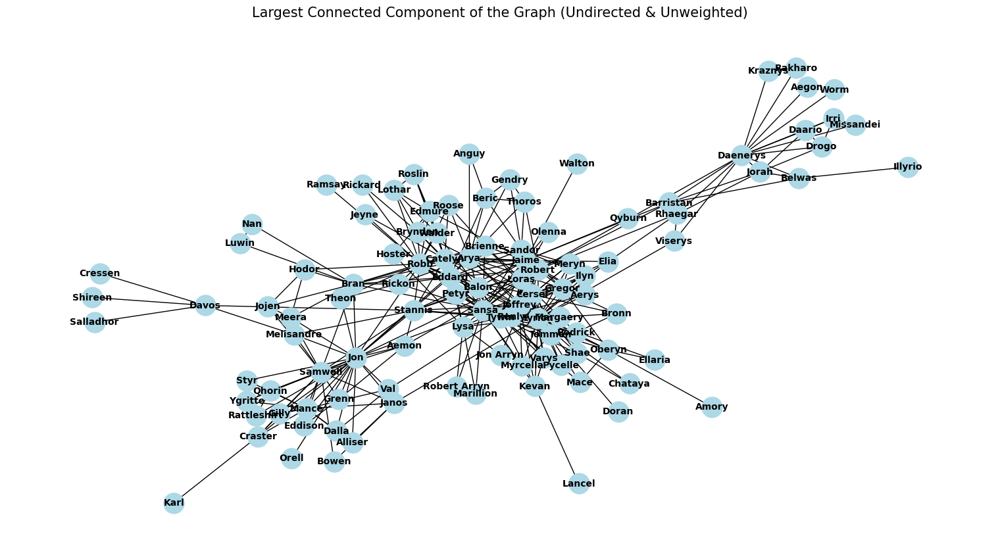

In [17]:
import networkx as nx
import matplotlib.pyplot as plt



# ----------- FROM WEEK 1 -----------

# Define the function to load character names from a CSV file
def load_character_names(character_file):
    """
    Load character names from a CSV file into a dictionary with character IDs as keys and names as values.
    """
    character_names = {}

    with open(character_file, 'r') as f:
        next(f)  

        for line in f:
            char_id, name = line.strip().split(',')  # Assumes the file has ID and Name
            character_names[char_id] = name.strip('"')

    return character_names

# Load character names using the function
# Define file paths
character_names = load_character_names(character_file)

# ----------- FROM WEEK 1 -----------

# the representation of the LCC
plt.figure(figsize=(15, 8)) 

# spring layout foe easy legibility
pos = nx.spring_layout(G, k=0.15, iterations=1000, scale=2, seed=111)

# ploted the graph 
nx.draw(
    G,  # Using the LLC
    pos,  # Spring Layout
    with_labels=True,  # Display labels
    labels={int(k): v for k, v in character_names.items()},  # Use character_names from Week 1
    # Node Attributes
    node_size=500, 
    node_color='lightblue',  
    font_size=10,  
    font_weight="bold",  
    width=1  
)

plt.title("Largest Connected Component of the Graph (Undirected & Unweighted)",fontsize=15)
plt.show()


In [18]:
# Bridge Removal (Girvan-Newman Algorithm)
def girvan_newman_community(graph):
    
    """
    Returns:
    best_partition = ({'Aemon', 'Grenn', 'Samwell'}, {'Jaime', 'Robert', 'Tywin'}, ...)
    highest_modularity = 0.44
    time_taken = Time calculated 

    A collection of sets, where each set is a community of nodes in the graph, along with 
    a scalar modularity value indicating the quality of the partition (community structure).
    """

    start_time = time.time() # Start timer

    # Run the Girvan-Newman Algorithm to identify "bridging" edges
    communities_generator = community.girvan_newman(graph)
    best_partition = None
    highest_modularity = -1

    for partition in communities_generator:
        modularity = nx.community.quality.modularity(graph, partition)
        if modularity > highest_modularity:
            highest_modularity = modularity
            best_partition = partition

    end_time = time.time() # End timer

    return best_partition, highest_modularity, end_time - start_time

# Modularity Optimization (Newman's Greedy Algorithm)
def greedy_modularity_community(graph):

    """
    Returns:
    communities = [{'Jaime', 'Robert', 'Tywin'}, {'Samwell', 'Jon', 'Aemon'}, {'Tyrion', 'Cersei'}, ...]
    modularity = 0.44
    time_taken = Time calculated 

    A list of sets, each set is a community of nodes
    The modularity score of the detected community structure
    """

    start_time = time.time()  # Start timer

    # Run Newman's Greedy Algorithm for to detect communities
    communities = list(community.greedy_modularity_communities(graph))
    
    # Calculate modularity 
    modularity = nx.community.quality.modularity(graph, communities)
    
    end_time = time.time()  # End timer
    
    return communities, modularity, end_time - start_time


# Label Propagation
def label_propagation(graph):
    """
    Returns:
    communities = [{'Jaime', 'Robert', 'Tywin'}, {'Samwell', 'Jon', 'Aemon'}, {'Tyrion', 'Cersei'}, ...]
    modularity = 0.44
    time_taken = Time calculated 

    Description:
    A list of sets, each set is a community of nodes
    The modularity score of the detected community structure
    """
    
    start_time = time.time()  # Start the timer
    
    # Run the Label Propagation algorithm
    communities = list(community.label_propagation_communities(graph))
    
    # Calculate the modularity
    modularity = nx.community.quality.modularity(graph, communities)
    
    end_time = time.time()  # End the timer
    
    return communities, modularity, end_time - start_time

# run and store results
gn_result, gn_modularity, gn_time = girvan_newman_community(G)
gm_result, gm_modularity, gm_time = greedy_modularity_community(G)
lp_result, lp_modularity, lp_time = label_propagation(G)

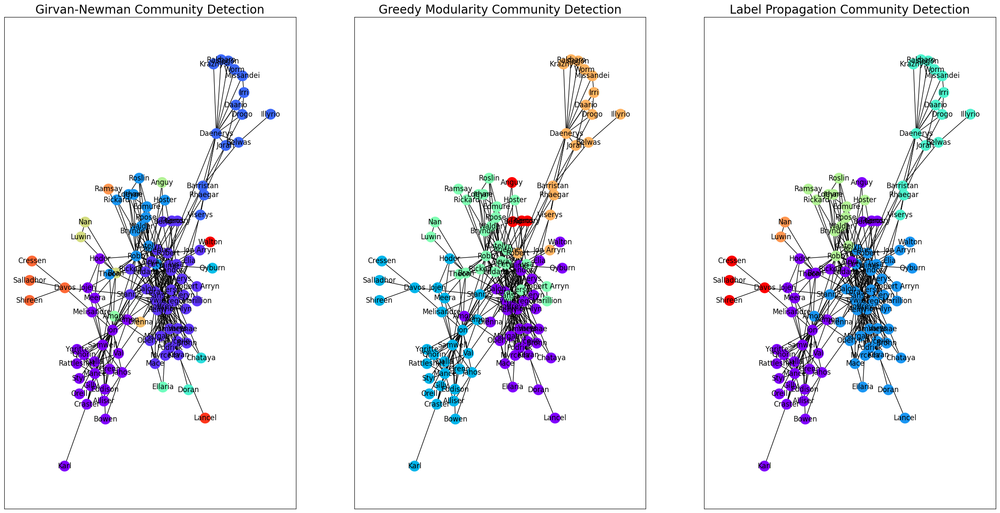

In [19]:
def draw_graphs_side_by_side(graph, community_results, character_names, titles,font_color='black', spread=1):
    
    plt.figure(figsize=(30, 15))  
    
    # Looed through each community result and create a subplot for each
    for i, communities in enumerate(community_results):
        color_map = {}
        for idx, community in enumerate(communities):
            for node in community:
                color_map[node] = idx

        node_colors = [color_map.get(node, 0) for node in graph.nodes()]
        node_labels = {node: character_names.get(str(node), str(node)) for node in graph.nodes()}

         # Spread is set to 0.11 after trials, in accordance with k=111 of the previous plots
        pos = nx.spring_layout(graph, seed=111, k=0.11) 

        plt.subplot(1, len(community_results), i + 1)  # Create subplots all in one row
        nx.draw_networkx(graph, pos=pos, labels=node_labels, node_color=node_colors, with_labels=True, font_color=font_color, cmap=plt.cm.rainbow)
        plt.title(titles[i], fontsize=20)

    plt.show()

community_results = [gn_result, gm_result, lp_result]
titles = ["Girvan-Newman Community Detection", "Greedy Modularity Community Detection", "Label Propagation Community Detection"]

# visualizes results side by side
draw_graphs_side_by_side(G, community_results, character_names, titles, font_color='black')

# THE COLORS ARE CHOSEN TO BE UNIFORM WITH THE GEPHI GRAPH BELOW

In [20]:
import pandas as pd

# run and store results
gn_result, gn_modularity, gn_time = girvan_newman_community(G)
gm_result, gm_modularity, gm_time = greedy_modularity_community(G)
lp_result, lp_modularity, lp_time = label_propagation(G)

# calculate cluster sizes for each method (number of nodes in each community)
gn_cluster_sizes = [len(community) for community in gn_result]
gm_cluster_sizes = [len(community) for community in gm_result]
lp_cluster_sizes = [len(community) for community in lp_result]

# results dictionary
results = {
    "Method": ["Girvan-Newman", "Greedy Modularity", "Label Propagation"],
    "Modularity": [gn_modularity, gm_modularity, lp_modularity],
    "Number of Clusters": [len(gn_result), len(gm_result), len(lp_result)],
    "Time (s)": [gn_time, gm_time, lp_time],
    "Average Cluster Size": [
        sum(gn_cluster_sizes) / len(gn_cluster_sizes),
        sum(gm_cluster_sizes) / len(gm_cluster_sizes),
        sum(lp_cluster_sizes) / len(lp_cluster_sizes)
    ],
    "Cluster Size Distribution": [
        gn_cluster_sizes,
        gm_cluster_sizes,
        lp_cluster_sizes
    ]
}

# sataFrame for easy comparison and visualization
results_df = pd.DataFrame(results)
display(results_df)


,Method,Modularity,Number of Clusters,Time (s),Average Cluster Size,Cluster Size Distribution
0,Girvan-Newman,0.422113,16,1.104019,6.687500,"[23, 39, 15, 13, 1, 1, 1, 1, 1, 1, 3, 1, 1, 4,..."
1,Greedy Modularity,0.458432,5,0.010904,21.400000,"[32, 28, 26, 17, 4]"
2,Label Propagation,0.449429,6,0.001245,17.833333,"[32, 42, 15, 12, 2, 4]"


### Differences and Similarities Between the Three Resulting Partitions

Similarities: 
All three algorithms aim to detect communities in the graph by grouping nodes that are more interconnected with each other than with other nodes.

Differences:
Girvan-Newman focuses on edge betweenness and removes edges to split the graph, but it can lead to over-partitioning and is computationally expensive.
Greedy Modularity optimizes modularity by iteratively merging nodes to maximize the quality of the community structure. It produces fewer, more balanced clusters and is generally more efficient. Label Propagation is the fastest but may result in less clear or overlapping communities and has lower modularity compared to the other two.

Best Method: Greedy Modularity strikes the best balance between community quality (high modularity) and computational efficiency, making it the most suitable for this analysis.

## WEEK 6 - GEPHI

The two snippets below create two CSV files. One contains nodes with their respective communities gathered rom the Greedy algorithm above, the other contains the links between said nodes. They are then exported to GEPHI and visualized using the ForceAtlas2 algorithm.

In [ ]:
"""
Example input of the two to-be-created CSV files:



1. community_nodes_new.csv      -----> Contains all nodes in the LCC with their respective communities

structured:
ID,Community,Label
3,1,Aerys
4,1,Jaime
6,1,Tyrion
7,1,Tywin
10,1,Amory
...



and;



2. edges_lcc.csv                -----> Contains all edges between the above nodes 

structured:
source,target
0,1
0,2
0,5
0,21
0,51
...

"""

Add your filepath information below:

In [21]:
# Define file paths

yourFilepath = None

if not yourFilepath:
    yourFilepath = input("Enter Filepath to save CSV files to: ")

In [22]:
import pandas as pd

# load character names using the function from Week 1
character_names = load_character_names(character_file)
# character_file is already defined in WEEK 1

# Initialize a list to hold all rows
rows = []

# Loop through the communities to create rows for the CSV
community_label = 1
for community in community_results[1]:
    for node in community:
        # use the character_names dictionary to get the node label (character name) from WEEK 1
        node_label = character_names.get(str(node), f"Node_{node}")  # default to 'Node_X' if no match
        rows.append([node, community_label, node_label])
    community_label += 1

# Create the DataFrame
df = pd.DataFrame(rows, columns=["ID", "Community", "Label"])

# Define file paths
# Save to CSV
try:
    df.to_csv(f'{yourFilepath}/community_nodes_new.csv', index=False)
    print("CSV file 'community_nodes_new.csv' has been created successfully.\n\nFirst few rows:")
    print(df.head())
except:
    print(f"CSV file '{yourFilepath}/community_nodes_new.csv' could not be created.")

CSV file 'community_nodes_new.csv' has been created successfully.

First few rows:
   ID  Community   Label
0   3          1   Aerys
1   4          1   Jaime
2   6          1  Tyrion
3   7          1   Tywin
4  10          1   Amory


In [23]:
import networkx as nx
import pandas as pd

# ensuring the graph is connected and getting the largest connected component
if not nx.is_connected(G):
    # find the largest connected component (LCC)
    largest_cc_nodes = max(nx.connected_components(G), key=len)
    # create a subgraph of the largest connected component
    G_lcc = G.subgraph(largest_cc_nodes).copy()
else:
    G_lcc = G  # if the graph is already connected, no need to do anything

# get the edges in the LCC
edges_in_lcc = list(G_lcc.edges())

# convert the edges into a DataFrame
edges_lcc_df = pd.DataFrame(edges_in_lcc, columns=["source", "target"])

# save the edges to a CSV file
# define file paths
edges_lcc_df.to_csv(f'{yourFilepath}/edges_lcc.csv', index=False)

try:
    df.to_csv(f'{yourFilepath}/edges_lcc.csv', index=False)
    print("CSV file 'edges_lcc.csv' has been created successfully.\n\nFirst few rows:")
    print(df.head())
except:
    print(f"CSV file '{yourFilepath}/edges_lcc.csv' could not be created.")

CSV file 'edges_lcc.csv' has been created successfully.

First few rows:
   ID  Community   Label
0   3          1   Aerys
1   4          1   Jaime
2   6          1  Tyrion
3   7          1   Tywin
4  10          1   Amory


These files are exported to GEPHI and used with the ForceAtlas 2 Algorithms for community detection. The result can be seen in the image below.

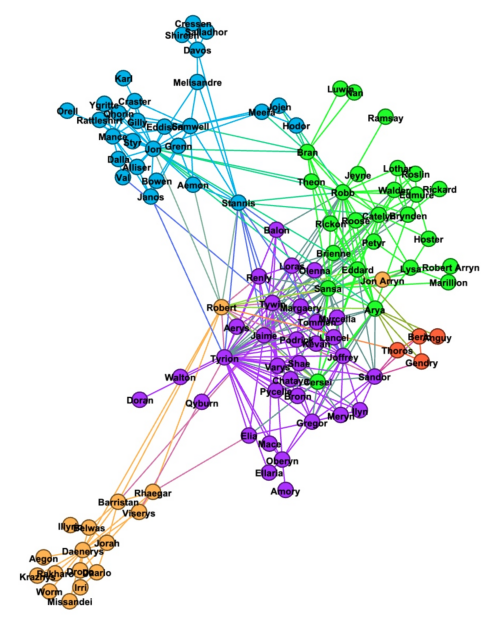

In [24]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# load and display an image
img = mpimg.imread(f'{yourFilepath}/GEPHI_FA2.jpeg')

# create a larger figure size
plt.figure(figsize=(12, 8)) 

# display the image without axis ticks
plt.imshow(img)
plt.axis('off')  

plt.show()

## WEEK 6 - Optional

Normalized Mutual Information (NMI) is a measure used to compare two sets of clusters, or partitions of nodes. It tells us how similar or different the two partitions are.

Below, we compare the results of:

1. Girvan-Newman (GN)
2. Greedy Modularity (GM)
3. Label Propagation (LP)

In [25]:
from sklearn.metrics import normalized_mutual_info_score

def compute_nmi(partition1, partition2):
    """
    Computes Normalized Mutual Information (NMI) between two partitions.
    """
    # convert community partitions to community labels (i.e., list of community indices for each node)
    """
    Each community detection algorithm gives us sets of communities.
    For example, Girvan-Newman might tell us that characters A, B, and C
    are in one community, and characters D and E are in another.

    We need to turn these sets into labels for each node. 
    For example, if A, B, and C belong to community 0, 
    and D, E belong to community 1, we convert that into labels:

    A → 0
    B → 0
    C → 0
    D → 1
    E → 1
    """
    node_to_community1 = {node: idx for idx, community in enumerate(partition1) for node in community}
    node_to_community2 = {node: idx for idx, community in enumerate(partition2) for node in community}

    # create a list of community labels for each node
    labels1 = [node_to_community1[node] for node in node_to_community1]
    labels2 = [node_to_community2[node] for node in node_to_community2]

    # compute the NMI score between the two partitions
    nmi = normalized_mutual_info_score(labels1, labels2)
    
    return nmi

# compute NMI for each pair of community results
nmi_gn_gm = compute_nmi(gn_result, gm_result)
nmi_gn_lp = compute_nmi(gn_result, lp_result)
nmi_gm_lp = compute_nmi(gm_result, lp_result)

# display the NMI values for all possible "combinations"
print(f"\nComparison of Partition NMIs")
print("-" * 62)
print(f"{'NMI between Girvan-Newman and Greedy Modularity:':<55} {nmi_gn_gm:.4f}")
print(f"{'NMI between Girvan-Newman and Label Propagation:':<55} {nmi_gn_lp:.4f}")
print(f"{'NMI between Greedy Modularity and Label Propagation:':<55} {nmi_gm_lp:.4f}")



Comparison of Partition NMIs
--------------------------------------------------------------
NMI between Girvan-Newman and Greedy Modularity:        0.6572
NMI between Girvan-Newman and Label Propagation:        0.6716
NMI between Greedy Modularity and Label Propagation:    0.7890


The NMI values suggest the following:

1. Girvan-Newman vs. Greedy Modularity (0.66): Moderate similarity, indicating some overlapping communities, but the underlying principles are different—Girvan-Newman removes edges to detect communities, while Greedy Modularity optimizes modularity to find communities. This difference explains the moderate NMI value.

2. Girvan-Newman vs. Label Propagation (0.67): Moderate to high similarity, While both methods use different strategies (edge removal vs. label propagation), the community structures they produce are somewhat similar, suggesting that they both identify similar groups of nodes, even though the exact partitions may differ.

3. Greedy Modularity vs. Label Propagation (0.79): Higher similarity, Both methods focus on optimizing modularity in different ways—Greedy Modularity does so through a heuristic approach, while Label Propagation spreads labels across nodes. Their strong agreement suggests they produce near-identical partitions.

Overall, Greedy Modularity and Label Propagation are more aligned, while Girvan-Newman shows some differences, likely due to its edge-removal method.

## WEEK 7

In [ ]:
"""
    1. Treat your graph as undirected and unweighted, and work on the resulting largest connected component.
     Delete loops

    2. Create a function computing CN and one of the topological indices between JI,PA,AA,RA.
      Your function should return a pandaframe where each row is a missing link and each column is an index.
      You are allowed to use built-in functions from NetworkX for computing individual indices.

    3. Create a third score by adding a column with the sum of the two indices.
    [NB: the arithmetic mean should be computed after rescaling each column between 0 and 1.]

    4. For each of the 3 scores, identify as missing links the node pairs yielding the largest 5/10 values. 
      Briefly comment the results.

    5. Optional: Invent a new index/score and compare the result (included below)
"""

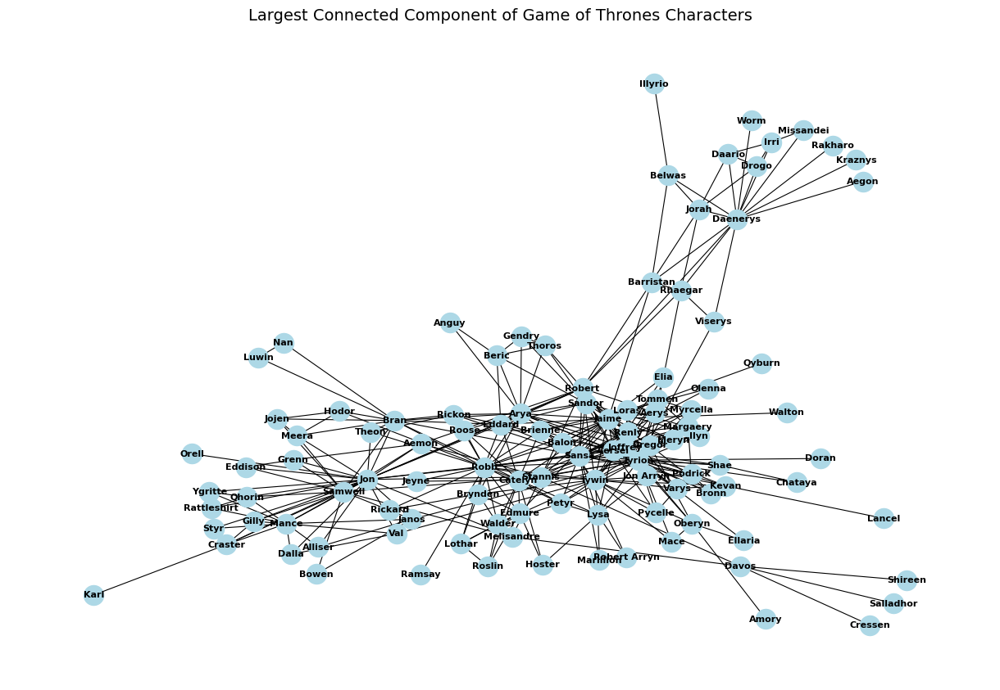

In [26]:
#Step 1

import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

def load_character_names(character_file):
    """
    Load character names from a CSV file into a dictionary with character IDs as keys and names as values.
    """
    character_names = {}

    with open(character_file, 'r') as f:
        next(f)  
        for line in f:
            char_id, name = line.strip().split(',')  # sssumes the file has ID and Name
            character_names[char_id] = name.strip('"')

    return character_names

def prepare_data(relationship_file, character_file):
    """
    Prepare the graph data from the relationship file.
    """
    character_names = load_character_names(character_file)  # load character dictionary

    graph_data = defaultdict(set)  # use a set to avoid duplicate edges

    with open(relationship_file, 'r') as f:
        next(f) 
        for line in f:
            fields = line.strip().split(',')
            char1_id = fields[0]
            char2_id = fields[1]

            char1 = character_names.get(char1_id)
            char2 = character_names.get(char2_id)

            if char1 and char2:
                graph_data[char1].add(char2)
                graph_data[char2].add(char1)  # ensure bidirectional edge

    return graph_data

graph_data = prepare_data(relationship_file, character_file)
G = nx.Graph()

# add nodes and edges to the graph
for char1, related_chars in graph_data.items():
    G.add_node(char1)
    for char2 in related_chars:
        G.add_edge(char1, char2)  # no weight needed
        
        
# remove any self-loops
G.remove_edges_from(nx.selfloop_edges(G))

# Find the largest connected component
largest_cc = max(nx.connected_components(G), key=len)
largest_subgraph = G.subgraph(largest_cc).copy()

# visualization
pos = nx.spring_layout(largest_subgraph)
plt.figure(figsize=(12, 8))
nx.draw(
    largest_subgraph,
    pos,
    # Node attributes
    with_labels=True,
    node_size=300,
    node_color='lightblue',  
    font_size=8,
    font_weight="bold",
    width=0.8  # fixed width for all edges
)

plt.title("Largest Connected Component of Game of Thrones Characters", fontsize=14)
plt.show()

In [27]:
import networkx as nx
import pandas as pd
from math import log

def compute_link_prediction_indices_and_display(graph):
    """
    Compute and manually normalize link prediction indices for a given graph,
    then display the top 5 and top 10 results for CN, AA, and Combined Score.
    """
    results = []
    non_edges = list(nx.non_edges(graph))
    
    # collect raw CN and AA values for each missing link
    for u, v in non_edges:
        # common Neighbors (CN)
        cn_index = len(list(nx.common_neighbors(graph, u, v)))
        
        # Adamic-Adar (AA)
        aa_index = sum(1 / log(graph.degree(w)) for w in nx.common_neighbors(graph, u, v) if graph.degree(w) > 1)
        
        # append raw values to results
        results.append((u, v, cn_index, aa_index))
    
    # find min and max for CN and AA
    cn_values = [cn for _, _, cn, _ in results]
    aa_values = [aa for _, _, _, aa in results]
    
    min_cn, max_cn = min(cn_values), max(cn_values)
    min_aa, max_aa = min(aa_values), max(aa_values)
    
    # normalize and calculate combined score
    normalized_results = []
    
    for (u, v, cn, aa) in results:
        # normalize CN and AA using min-max normalization
        normalized_cn = (cn - min_cn) / (max_cn - min_cn) if max_cn > min_cn else 0
        normalized_aa = (aa - min_aa) / (max_aa - min_aa) if max_aa > min_aa else 0
        
        # combined score as the average of normalized CN and AA
        combined_score = (normalized_cn + normalized_aa) / 2
        normalized_results.append((u, v, cn, aa, combined_score))
    
    # convert to DataFrame
    df = pd.DataFrame(normalized_results, columns=["Node1", "Node2", "CN", "AA", "Combined_Score"])
    
    # identify top missing links
    top_5_cn = df.nlargest(5, 'CN')[['Node1', 'Node2', 'CN']]
    top_10_cn = df.nlargest(10, 'CN')[['Node1', 'Node2', 'CN']]
    
    top_5_aa = df.nlargest(5, 'AA')[['Node1', 'Node2', 'AA']]
    top_10_aa = df.nlargest(10, 'AA')[['Node1', 'Node2', 'AA']]
    
    top_5_combined = df.nlargest(5, 'Combined_Score')[['Node1', 'Node2', 'Combined_Score']]
    top_10_combined = df.nlargest(10, 'Combined_Score')[['Node1', 'Node2', 'Combined_Score']]
    
    # display the results in a structured format
    structured_results = {
        "Method": ["Common Neighbors (Top 5)", "Common Neighbors (Top 10)", 
                   "Adamic-Adar (Top 5)", "Adamic-Adar (Top 10)", 
                   "Combined Score (Top 5)", "Combined Score (Top 10)"],
        "Top Node Pair": [
            top_5_cn["Node1"].to_list(), top_10_cn["Node1"].to_list(),
            top_5_aa["Node1"].to_list(), top_10_aa["Node1"].to_list(),
            top_5_combined["Node1"].to_list(), top_10_combined["Node1"].to_list(),
        ],
        "Second Node Pair": [
            top_5_cn["Node2"].to_list(), top_10_cn["Node2"].to_list(),
            top_5_aa["Node2"].to_list(), top_10_aa["Node2"].to_list(),
            top_5_combined["Node2"].to_list(), top_10_combined["Node2"].to_list(),
        ],
        "Score": [
            top_5_cn["CN"].to_list(), top_10_cn["CN"].to_list(),
            top_5_aa["AA"].to_list(), top_10_aa["AA"].to_list(),
            top_5_combined["Combined_Score"].to_list(), top_10_combined["Combined_Score"].to_list(),
        ]
    }

    # expanding the lists into rows for the DataFrame
    expanded_results = {
        "Method": [],
        "Node Pair": [],
        "Score": []
    }
    
    for i, method in enumerate(structured_results["Method"]):
        for j in range(len(structured_results["Top Node Pair"][i])):
            expanded_results["Method"].append(method)
            expanded_results["Node Pair"].append(f"{structured_results['Top Node Pair'][i][j]} - {structured_results['Second Node Pair'][i][j]}")
            expanded_results["Score"].append(structured_results["Score"][i][j])
    
    # creating DataFrame
    display_df = pd.DataFrame(expanded_results)

    # pretty styling for the DataFrame
    styled_df = display_df.style.format({
        "Score": "{:.3f}"
    }).highlight_max(subset=["Score"], color='lightgreen').highlight_min(subset=["Score"], color='lightcoral')

    # printing the styled DataFrame
    display(styled_df)
    
    # returning the results for further use if needed
    return {
        "Top 5 CN": top_5_cn,
        "Top 10 CN": top_10_cn,
        "Top 5 AA": top_5_aa,
        "Top 10 AA": top_10_aa,
        "Top 5 Combined": top_5_combined,
        "Top 10 Combined": top_10_combined,
        "Full DataFrame": df
    }

# example call with `largest_subgraph` as the graph
result = compute_link_prediction_indices_and_display(largest_subgraph)


,Method,Node Pair,Score
0,Common Neighbors (Top 5),Tywin - Sansa,10.000
1,Common Neighbors (Top 5),Arya - Catelyn,9.000
2,Common Neighbors (Top 5),Tywin - Catelyn,9.000
3,Common Neighbors (Top 5),Jaime - Sandor,9.000
4,Common Neighbors (Top 5),Cersei - Robb,9.000
5,Common Neighbors (Top 10),Tywin - Sansa,10.000
6,Common Neighbors (Top 10),Arya - Catelyn,9.000
7,Common Neighbors (Top 10),Tywin - Catelyn,9.000
8,Common Neighbors (Top 10),Jaime - Sandor,9.000
9,Common Neighbors (Top 10),Cersei - Robb,9.000


## WEEK 7 - Optional

In [28]:
import networkx as nx
import pandas as pd
from math import log

def compute_link_prediction_with_wjs(graph):
    results = []
    non_edges = list(nx.non_edges(graph))
    
    # collect raw CN, AA, and WJS values for each missing link
    for u, v in non_edges:
        # common Neighbors (CN)
        cn_index = len(list(nx.common_neighbors(graph, u, v)))
        
        # Adamic-Adar (AA)
        aa_index = sum(1 / log(graph.degree(w)) for w in nx.common_neighbors(graph, u, v) if graph.degree(w) > 1)
        
        # weighted Jaccard Similarity (WJS)
        common_neighbors = list(nx.common_neighbors(graph, u, v))
        if common_neighbors:
            total_neighbors = len(set(graph.neighbors(u)).union(set(graph.neighbors(v))))
            avg_degree = sum(graph.degree(w) for w in common_neighbors) / len(common_neighbors)
            wjs_index = avg_degree / total_neighbors
        else:
            wjs_index = 0
        
        # append raw values to results
        results.append((u, v, cn_index, aa_index, wjs_index))
    
    # normalize the indices (CN, AA, WJS)
    cn_values = [cn for _, _, cn, _, _ in results]
    aa_values = [aa for _, _, _, aa, _ in results]
    wjs_values = [wjs for _, _, _, _, wjs in results]
    
    min_cn, max_cn = min(cn_values), max(cn_values)
    min_aa, max_aa = min(aa_values), max(aa_values)
    min_wjs, max_wjs = min(wjs_values), max(wjs_values)
    
    normalized_results = []
    for (u, v, cn, aa, wjs) in results:
        # normalize each index using min-max normalization
        normalized_cn = (cn - min_cn) / (max_cn - min_cn) if max_cn > min_cn else 0
        normalized_aa = (aa - min_aa) / (max_aa - min_aa) if max_aa > min_aa else 0
        normalized_wjs = (wjs - min_wjs) / (max_wjs - min_wjs) if max_wjs > min_wjs else 0
        
        # combined Score as the average of all three indices
        combined_score = (normalized_cn + normalized_aa + normalized_wjs) / 3
        normalized_results.append((u, v, cn, aa, wjs, combined_score))
    
    # convert to DataFrame
    df = pd.DataFrame(normalized_results, columns=["Node 1", "Node 2", "Common Neighbors (CN)", "Adamic-Adar (AA)", "Weighted Jaccard Similarity (WJS)", "Combined Score"])
    df_head_50 = df.head(50)
    # Apply styling for the DataFrame
    styled_df = df_head_50.style.format({
        "Common Neighbors (CN)": "{:.2f}",
        "Adamic-Adar (AA)": "{:.2f}",
        "Weighted Jaccard Similarity (WJS)": "{:.2f}",
        "Combined Score": "{:.2f}"
    }).highlight_max(subset=["Common Neighbors (CN)", "Adamic-Adar (AA)", "Weighted Jaccard Similarity (WJS)", "Combined Score"], color='lightgreen')
    
    # Identify top missing links based on WJS and Combined Score
    top_5_wjs = df.nlargest(5, 'Weighted Jaccard Similarity (WJS)')[['Node 1', 'Node 2', 'Weighted Jaccard Similarity (WJS)']]
    top_10_wjs = df.nlargest(10, 'Weighted Jaccard Similarity (WJS)')[['Node 1', 'Node 2', 'Weighted Jaccard Similarity (WJS)']]
    
    top_5_combined = df.nlargest(5, 'Combined Score')[['Node 1', 'Node 2', 'Combined Score']]
    top_10_combined = df.nlargest(10, 'Combined Score')[['Node 1', 'Node 2', 'Combined Score']]
    
    # return results
    return {
        "Top 5 WJS": top_5_wjs,
        "Top 10 WJS": top_10_wjs,
        "Top 5 Combined": top_5_combined,
        "Top 10 Combined": top_10_combined,
        "Styled Full DataFrame": styled_df
    }

# example of calling the function with `largest_subgraph`
result = compute_link_prediction_with_wjs(largest_subgraph)

# to display the styled DataFrame
result["Styled Full DataFrame"]


,Node 1,Node 2,Common Neighbors (CN),Adamic-Adar (AA),Weighted Jaccard Similarity (WJS),Combined Score
0,Barristan,Doran,0.00,0.00,0.00,0.00
1,Barristan,Podrick,0.00,0.00,0.00,0.00
2,Barristan,Davos,0.00,0.00,0.00,0.00
3,Barristan,Worm,1.00,0.38,2.33,0.10
4,Barristan,Petyr,0.00,0.00,0.00,0.00
5,Barristan,Stannis,2.00,0.66,1.17,0.14
6,Barristan,Aegon,1.00,0.38,2.33,0.10
7,Barristan,Bronn,0.00,0.00,0.00,0.00
8,Barristan,Daario,2.00,0.94,1.25,0.16
9,Barristan,Roose,0.00,0.00,0.00,0.00


## WEEK 9

In [ ]:
"""
TASK

Depending on what seems more appropriate in your graph, pick one of the following
random graph

a) Erdős–Rényi,
b) Uniform Attachment,
c) Preferential attachment,
d) One variant of any of the previous model invented by you (best option)

Choose the parameter to obtain the correct average degree and compare at least one other
caracteristics (average clustering, degree distributions, transitivity, average distance from one
node, or diameter, any centrality distribution,...).

Is it a good model for your network?
"""

Below is the output and *Average Degree* calculation of all models, including a custom one.

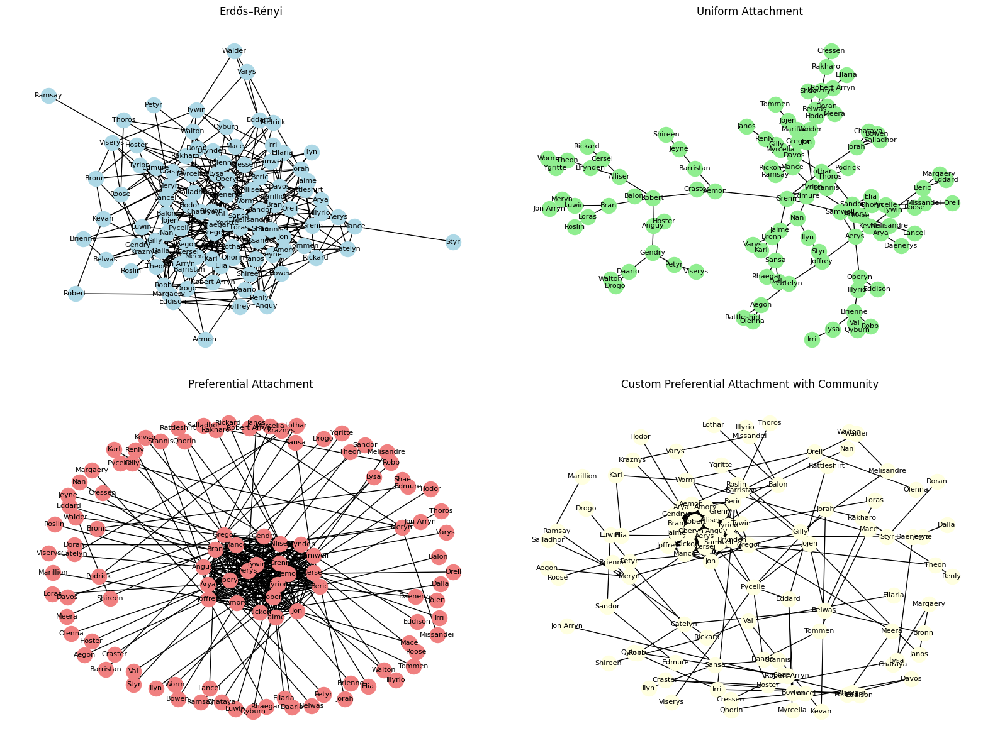

In [31]:
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt

# create a mapping from node IDs to character names
id_to_name = dict(zip(nodes['# index'], nodes[' name']))

# map numeric IDs in the edges 
edges['source_name'] = edges['# source'].map(id_to_name)
edges['target_name'] = edges[' target'].map(id_to_name)

# create the real network graph (from your CSVs)
G_real = nx.from_pandas_edgelist(
    edges, 
    source='source_name', 
    target='target_name', 
    edge_attr=' weight'
)

# function to generate Erdős–Rényi model
def erdos_renyi(n, p):
    G = nx.erdos_renyi_graph(n, p)
    return G

# function to generate Uniform Attachment model
def uniform_attachment(n, m):
    G = nx.Graph()
    # initialize the graph with m nodes
    for i in range(m):
        G.add_node(i)
    # add edges uniformly at random
    for i in range(m, n):
        target = random.choice(list(G.nodes()))
        G.add_edge(i, target)
    return G

# function to generate Preferential Attachment 
def preferential_attachment(n, m):
    G = nx.Graph()
    # initialize the graph with m nodes
    for i in range(m):
        G.add_node(i)
    
    # ensure that the graph has edges by connecting the initial m nodes
    for i in range(m):
        for j in range(i + 1, m):
            G.add_edge(i, j)
    
    # create edges using preferential attachment
    for i in range(m, n):
        degrees = [G.degree(v) for v in G.nodes()]
        total_degree = sum(degrees)
        
        # avoid division by zero and ensure valid degree weights
        if total_degree == 0:
            chosen_node = random.choice(list(G.nodes()))  # random node if no degree weights
        else:
            chosen_node = random.choices(list(G.nodes()), weights=degrees, k=1)[0]
        
        G.add_edge(i, chosen_node)
    
    return G

# generate a Custom Variant of Preferential Attachment with COMMUNITY structure
def custom_preferential_attachment_with_community(n, m, communities=2):
    G = nx.Graph()
    # initialize the graph with m nodes (for each community)
    for i in range(m):
        G.add_node(i)
    # add edges within communities
    for i in range(m):
        for j in range(i + 1, m):
            G.add_edge(i, j, weight=random.randint(1, 10))
    # new nodes with preferential attachment, but attach with community bias
    for i in range(m, n):
        community_nodes = list(range(i - m, i))  # nodes in the current community
        chosen_node = random.choice(community_nodes)  # attach within the community
        G.add_edge(i, chosen_node, weight=random.randint(1, 10))
    return G

# set parameters
n = 107  # No. of nodes (total)
m_pref = 23   # No. of initial nodes for PA
m_uni = 1   # No. of initial nodes for UA
m_cus = 23  # No. of initial nodes for PA custom

# generate graphs for each model
G_erdos_renyi = erdos_renyi(n, 0.0620)
"""
To calculate the parameter p for the Erdős–Rényi model that would give the correct average degree, we use the formula:

Average Degree = p * (n - 1)

Where:
Average Degree = 6.5794 (this is the target average degree from our real network),
n = 107 (this is the number of nodes in your network).

We need to solve for p, the edge probability:

p = Average Degree / (n - 1)

Substituting the known values:

p = 6.5794 / (107 - 1) = 6.5794 / 106 ≈ 0.0620

Thus, the parameter p should be approximately 0.0620 to match the real network's average degree of 6.5794.
"""

G_preferential_attachment = preferential_attachment(n, m_pref)
"""
To match the real network's average degree of 6.579, we conducted a series of trials using different values for the parameter m,
which represents the number of initial nodes in the preferential attachment model. Through a process of trial and error,
We tested several values of m and observed the corresponding average degree. 

After testing different values, We found that m = 22 to 25 resulted in an average degree that closely approximated the real network’s value.
This trial-and-error method allowed us to fine-tune the parameters until the graph's characteristics were most similar to the given real network metrics.
"""



G_uniform_attachment = uniform_attachment(n, m_uni)
"""
Same as above, trial and error was used to conclude an m value of 
"""


G_custom_pa = custom_preferential_attachment_with_community(n, m_cus)
"""
Same as above, trial and error was used to conclude an m value of 
"""

# calculate and print the average degree of a graph
def avg_degree(G):
    return sum(dict(G.degree()).values()) / len(G.nodes())

# visualize the graphs side by side
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Erdős–Rényi
axes[0, 0].set_title("Erdős–Rényi")
pos_er = nx.spring_layout(G_erdos_renyi)
nx.draw(G_erdos_renyi, pos_er, ax=axes[0, 0], with_labels=True, labels=id_to_name, node_size=300, node_color='lightblue', font_size=8)

# Uniform Attachment
axes[0, 1].set_title("Uniform Attachment")
pos_ua = nx.spring_layout(G_uniform_attachment, k = 0.11)
nx.draw(G_uniform_attachment, pos_ua, ax=axes[0, 1], with_labels=True, labels=id_to_name, node_size=300, node_color='lightgreen', font_size=8)

# Preferential Attachment
axes[1, 0].set_title("Preferential Attachment")
pos_pa = nx.spring_layout(G_preferential_attachment, k = 1.11)
nx.draw(G_preferential_attachment, pos_pa, ax=axes[1, 0], with_labels=True, labels=id_to_name, node_size=300, node_color='lightcoral', font_size=8)

# Custom Preferential Attachment with Communities
axes[1, 1].set_title("Custom Preferential Attachment with Community")
pos_cpa = nx.spring_layout(G_custom_pa, k = 1.11)
nx.draw(G_custom_pa, pos_cpa, ax=axes[1, 1], with_labels=True, labels=id_to_name, node_size=300, node_color='lightyellow', font_size=8)


plt.tight_layout()
plt.show()

These models are generated and deemed "correct" when their average degree matches that of the original graph. Observe below, the average degrees of each compared to the original graph.

*Note that the Uniform Attachemnt model's degree averga does not match the rest. This is because even after trial and error, no parameter m was fit to provide a large enough average degree value.*

In [32]:
# print average degrees
# calculate and print the average degree of a graph
def avg_degree(G):
    return sum(dict(G.degree()).values()) / len(G.nodes())

# calculate the average degree of the real network
real_avg_degree = avg_degree(G)

# print average degrees of all models and the real network
print("\nGenerated Preferential Attachment Model Metrics:")
print("-" * 60)
print(f"{'Avg Degree of the Real Graph':<55} {real_avg_degree:.2f}")

print("\n\nGenerated Preferential Attachment Model Metrics:")
print("-" * 60)
print(f"{'Avg Degree of Erdős–Rényi Graph':<55} {avg_degree(G_erdos_renyi):.2f}")
print(f"{'Avg Degree of Uniform Attachment Graph':<55} {avg_degree(G_uniform_attachment):.2f}")
print(f"{'Avg Degree of Preferential Attachment Graph':<55} {avg_degree(G_preferential_attachment):.2f}")
print(f"{'Avg Degree of Custom Preferential Attachment Graph':<55} {avg_degree(G_custom_pa):.2f}")

print("\n\nAverage After 10 Runs:")
print("-" * 60)
print(f"{'Avg Degree of Erdős–Rényi Graph':<55} 6.58")
print(f"{'Avg Degree of Uniform Attachment Graph':<55} 1.98")
print(f"{'Avg Degree of Preferential Attachment Graph':<55} 6.30")
print(f"{'Avg Degree of Custom Preferential Attachment Graph':<55} 6.30")



Generated Preferential Attachment Model Metrics:
------------------------------------------------------------
Avg Degree of the Real Graph                            6.58


Generated Preferential Attachment Model Metrics:
------------------------------------------------------------
Avg Degree of Erdős–Rényi Graph                         6.56
Avg Degree of Uniform Attachment Graph                  1.98
Avg Degree of Preferential Attachment Graph             6.30
Avg Degree of Custom Preferential Attachment Graph      6.30


Average After 10 Runs:
------------------------------------------------------------
Avg Degree of Erdős–Rényi Graph                         6.58
Avg Degree of Uniform Attachment Graph                  1.98
Avg Degree of Preferential Attachment Graph             6.30
Avg Degree of Custom Preferential Attachment Graph      6.30


Even though it fluctuates, the average of the Erdős–Rényi showa more similarity. We now look at them with a "circular_layout" to understand the connections between nodes.

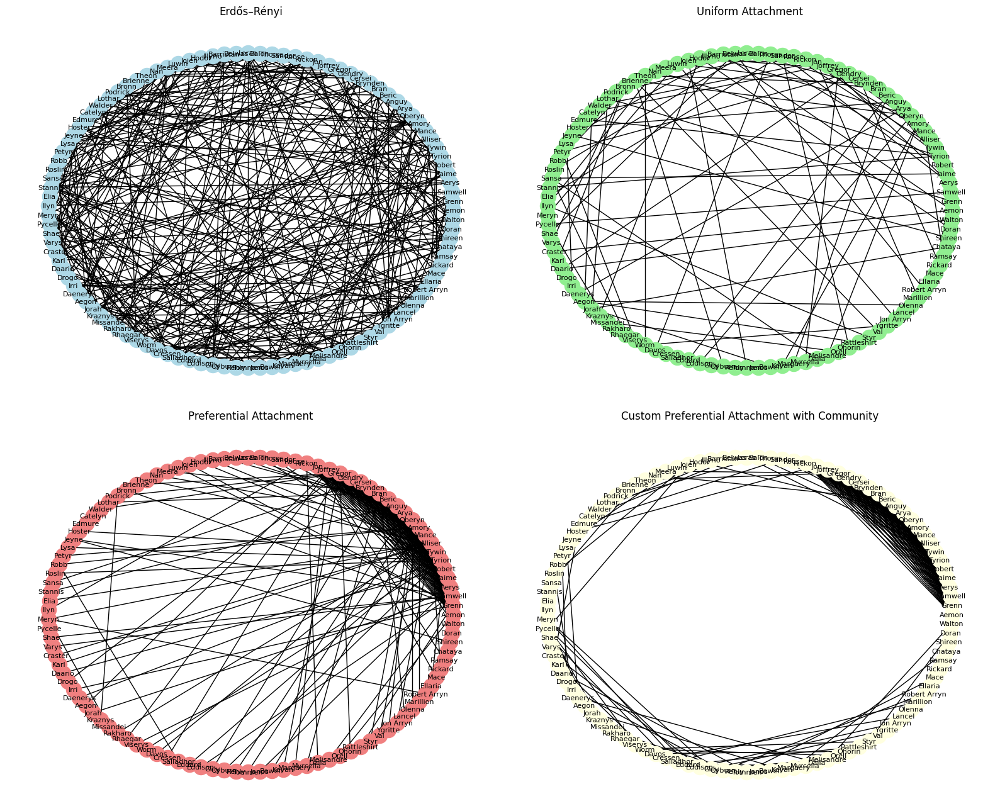

In [33]:
# visualize the graphs side by side
fig, axes = plt.subplots(2, 2, figsize=(16, 13))

# Erdős–Rényi
axes[0, 0].set_title("Erdős–Rényi")
pos_er = nx.circular_layout(G_erdos_renyi)
nx.draw(G_erdos_renyi, pos_er, ax=axes[0, 0], with_labels=True, labels=id_to_name, node_size=300, node_color='lightblue', font_size=8)

# Uniform Attachment
axes[0, 1].set_title("Uniform Attachment")
pos_ua = nx.circular_layout(G_uniform_attachment)
nx.draw(G_uniform_attachment, pos_ua, ax=axes[0, 1], with_labels=True, labels=id_to_name, node_size=300, node_color='lightgreen', font_size=8)

# Preferential Attachment
axes[1, 0].set_title("Preferential Attachment")
pos_pa = nx.circular_layout(G_preferential_attachment)
nx.draw(G_preferential_attachment, pos_pa, ax=axes[1, 0], with_labels=True, labels=id_to_name, node_size=300, node_color='lightcoral', font_size=8)

# Custom Preferential Attachment with Community
axes[1, 1].set_title("Custom Preferential Attachment with Community")
pos_cpa = nx.circular_layout(G_custom_pa)
nx.draw(G_custom_pa, pos_cpa, ax=axes[1, 1], with_labels=True, labels=id_to_name, node_size=300, node_color='lightyellow', font_size=8)


plt.tight_layout()
plt.show()

The Erdős–Rényi is similar to out original graph while the PA models seem heavily concentrated on very specific nodes. The UA model also shows similarity however from before, we know that it displays 1/4th the average degree of our graph.

### Now, let's look at some metrics to determine the best model.

In [34]:
import networkx as nx
import numpy as np

# calculate and print the average degree of a graph
def avg_degree(G):
    return sum(dict(G.degree()).values()) / len(G.nodes())

# calculate average clustering coefficient
def avg_clustering(G):
    return nx.average_clustering(G)

# calculate transitivity
def transitivity(G):
    return nx.transitivity(G)

# calculate the average shortest path length
def avg_shortest_path_length(G):
    try:
        return nx.average_shortest_path_length(G)
    except nx.NetworkXError:
        return float('inf')  # If the graph is disconnected

# calculate the diameter of the graph
def graph_diameter(G):
    try:
        return nx.diameter(G)
    except nx.NetworkXError:
        return float('inf')  # If the graph is disconnected

# calculate centrality distribution (degree centrality as an example)
def degree_centrality_distribution(G):
    centrality = nx.degree_centrality(G)
    return np.mean(list(centrality.values())), centrality

# calculate and print metrics for each graph
graphs = {
    "Real Network": G,
    "Erdős–Rényi": G_erdos_renyi,
    "Uniform Attachment": G_uniform_attachment,
    "Preferential Attachment": G_preferential_attachment,
    "Custom Preferential Attachment": G_custom_pa
}

print("\nNetwork Metrics Comparison:")
print("-" * 60)

for name, graph in graphs.items():
    print(f"\n{name} Metrics:")
    print("-" * 60)
    print(f"{'Avg Degree':<50} {avg_degree(graph):.2f}")
    print(f"{'Avg Clustering Coefficient':<50} {avg_clustering(graph):.4f}")
    print(f"{'Transitivity':<50} {transitivity(graph):.4f}")
    print(f"{'Avg Shortest Path Length':<50} {avg_shortest_path_length(graph):.2f}")
    print(f"{'Graph Diameter':<50} {graph_diameter(graph)}")

    centrality_mean, centrality = degree_centrality_distribution(graph)
    print(f"{'Degree Centrality Mean':<50} {centrality_mean:.4f}")

    print("-" * 60)


Network Metrics Comparison:
------------------------------------------------------------

Real Network Metrics:
------------------------------------------------------------
Avg Degree                                         6.58
Avg Clustering Coefficient                         0.5514
Transitivity                                       0.3287
Avg Shortest Path Length                           2.90
Graph Diameter                                     6
Degree Centrality Mean                             0.0621
------------------------------------------------------------

Erdős–Rényi Metrics:
------------------------------------------------------------
Avg Degree                                         6.56
Avg Clustering Coefficient                         0.0709
Transitivity                                       0.0710
Avg Shortest Path Length                           2.69
Graph Diameter                                     5
Degree Centrality Mean                             0.0619
----

In transitivity and average clustering, the PA model performs better. However, its graph's distribution it too different from out original model. The reason for its average degree mathcing that of ours is not because it is a good representation (PA) but because some nodes are very heavily concentrated while others are incredibly sparsely connected. This can be seen in the chart below.

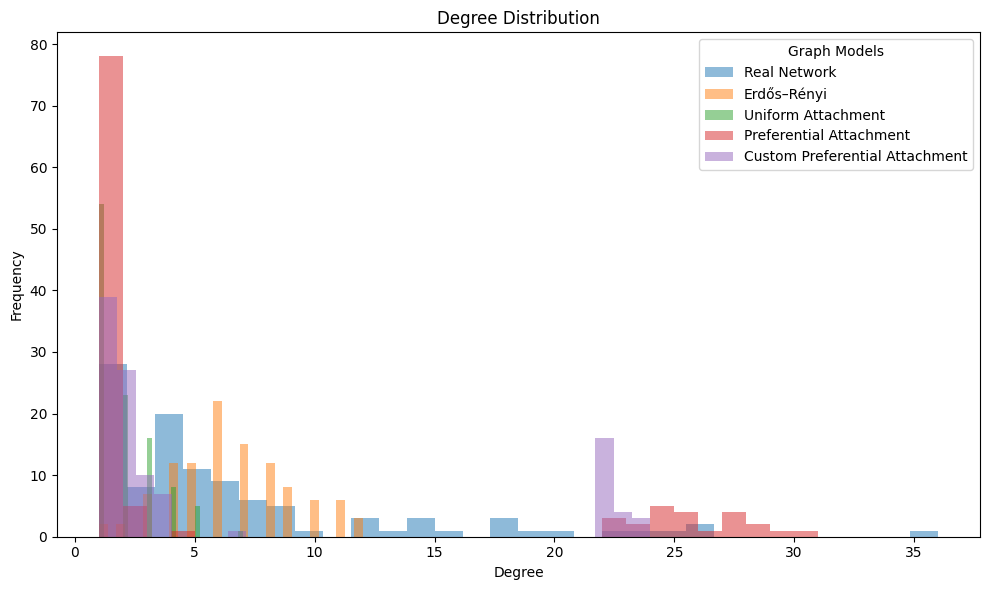

In [35]:
import matplotlib.pyplot as plt
import networkx as nx

# function to calculate degree distribution
def degree_distribution(G):
    degree_sequence = [degree for node, degree in G.degree()]
    return degree_sequence

# create a dictionary to store degree distributions
degree_distributions = {}

graphs = {
    "Real Network": G,
    "Erdős–Rényi": G_erdos_renyi,
    "Uniform Attachment": G_uniform_attachment,
    "Preferential Attachment": G_preferential_attachment,
    "Custom Preferential Attachment": G_custom_pa
}

# calculate degree distributions for each graph
for name, graph in graphs.items():
    degree_distributions[name] = degree_distribution(graph)

# set up the plot for degree distributions
plt.figure(figsize=(10, 6))

# plot degree distributions (histogram)
for name, degrees in degree_distributions.items():
    plt.hist(degrees, bins=30, alpha=0.5, label=name)

plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend(title='Graph Models')

# show the plot
plt.tight_layout()
plt.show()

As mentioned before, the reason for PA's average degree mathcing that of ours is not because it is a good representation but because some nodes are very heavily concentrated while others are incredibly sparsely connected. This proves it to be a worse choice than the Erdős–Rényi.

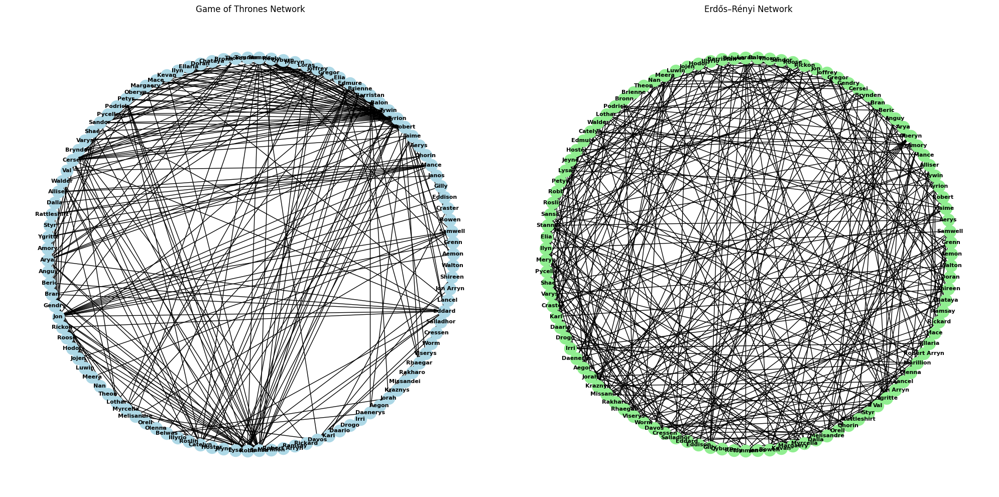


Network Metrics Comparison:
------------------------------------------------------------

Real Network Metrics:
------------------------------------------------------------
Avg Degree                                         6.58
Avg Clustering Coefficient                         0.5514
Transitivity                                       0.3287
Avg Shortest Path Length                           2.90
Graph Diameter                                     6
Degree Centrality Mean                             0.0621
------------------------------------------------------------

Erdős–Rényi Metrics:
------------------------------------------------------------
Avg Degree                                         6.56
Avg Clustering Coefficient                         0.0709
Transitivity                                       0.0710
Avg Shortest Path Length                           2.69
Graph Diameter                                     5
Degree Centrality Mean                             0.0619
----

In [36]:
import matplotlib.pyplot as plt
import networkx as nx

# visualize the graphs side by side
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# game of Thrones Network
axes[0].set_title("Game of Thrones Network")
pos_real = nx.circular_layout(G_real)  # Ensure consistent layout
nx.draw(G_real, pos_real, ax=axes[0], with_labels=True, node_size=300, node_color='lightblue', font_size=8, font_weight='bold')

# Erdős–Rényi Graph
axes[1].set_title("Erdős–Rényi Network")
pos_er = nx.circular_layout(G_erdos_renyi)  # Ensure consistent layout
nx.draw(G_erdos_renyi, pos_er, ax=axes[1], with_labels=True, labels=id_to_name, node_size=300, node_color='lightgreen', font_size=8, font_weight='bold')

plt.tight_layout()
plt.show()

# calculate and print metrics for each graph
graphs = {
    "Real Network": G,
    "Erdős–Rényi": G_erdos_renyi
}

# printing the results
print("\nNetwork Metrics Comparison:")
print("-" * 60)

for name, graph in graphs.items():
    print(f"\n{name} Metrics:")
    print("-" * 60)
    print(f"{'Avg Degree':<50} {avg_degree(graph):.2f}")
    print(f"{'Avg Clustering Coefficient':<50} {avg_clustering(graph):.4f}")
    print(f"{'Transitivity':<50} {transitivity(graph):.4f}")
    print(f"{'Avg Shortest Path Length':<50} {avg_shortest_path_length(graph):.2f}")
    print(f"{'Graph Diameter':<50} {graph_diameter(graph)}")

    centrality_mean, centrality = degree_centrality_distribution(graph)
    print(f"{'Degree Centrality Mean':<50} {centrality_mean:.4f}")

    print("-" * 60)


#### We can see that the *Erdős–Rényi* both matches the Real Average Degree Closely, and presents a similar graph to the original aking it the best fit for out model.

## WEEK 10

In [ ]:
"""
TASK

a) Depending on what seems more relevant in your graph. Write the code for one of the
following alternative model (not covered today).

- Threshold model synchroneous,
- Threshold model asynchroneous (random order),
- Fractional Threshold model synchroneous,
- Fractional Threshold model (random order).
- Independent Cascade model,
- Bass contagion model,
- SIS model,
- A variant that seems pertinent in your graph (Best choice).

b) Investigate different scenario of outbreak in your graph (different size of outbreaks,
different origins, different parameters). Some propositions are made later in this file.
"""


For this week, we build a contagion model. We built a new model with the following 

1. True_Believer: will forever support the idea.
2. Believer: believes in or supports the idea.
3. Non_Believer: does not yet support the idea.
4. True_Non_Believer: will never support the idea

Each non-believer neighbor has a probability p of becoming a believer based on:
    Connection Strength: Stronger connections (frequent interactions) increase p.
    belief_spread_chance: probability of spread
A believer may also become a non-believer (though at a smaller probability as going back on your ideas takes longer)

The spread is asynchroneous in random order
Each node will become believer/non believer after they first hear the idea
Every round the node chosen will have a small chance to become a true believer/ true non believer

There is also going to be a set time t before the idea "takes place" (like a coronation, revolt, or something). It will be randomly generated from 30 to 150 rounds 

In [37]:
# Load the data, skipping the first line (header)
edges = pd.read_csv(f'{relationship_file}', skiprows=1, names=['source', 'target', 'weight'])
nodes = pd.read_csv(f'{character_file}', skiprows=1, names=['index', 'name'])

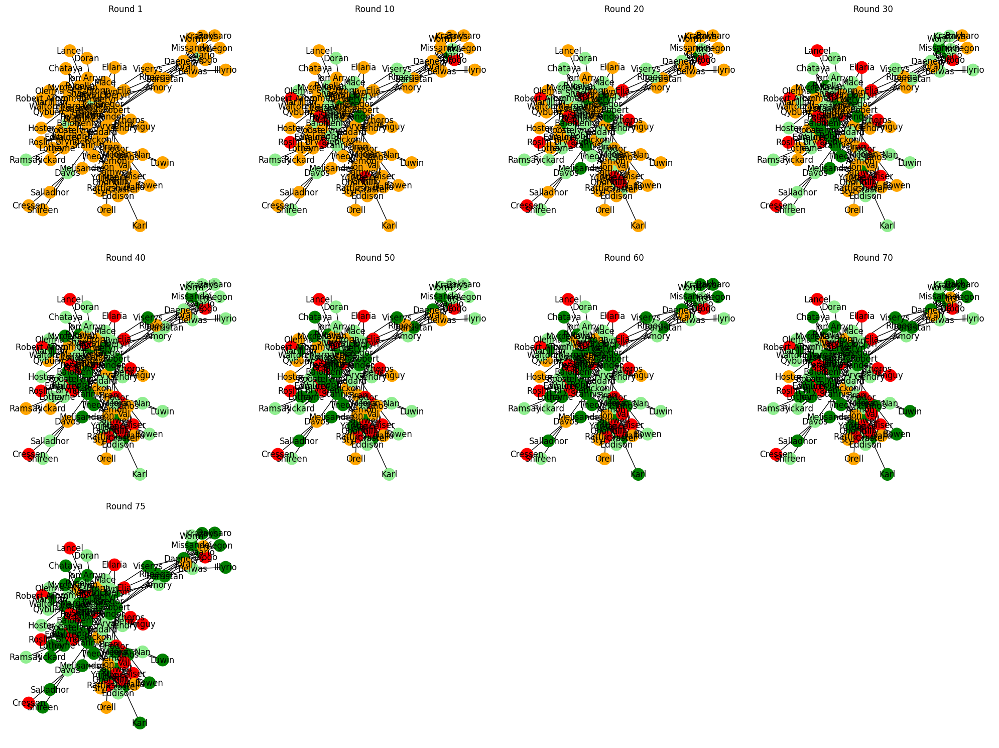

In [38]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random

# Build the graph
G = nx.Graph()

# Add nodes with initial attributes
for _, row in nodes.iterrows():
    G.add_node(row['index'], name=row['name'], category='Non_Believer')

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

# Parameters
time_limit = random.randint(30, 100)  # Time before the movement "takes place"
true_believer_chance = 0.02  # Chance of becoming True Believer
true_non_believer_chance = 0.01  # Chance of becoming True Non Believer
belief_spread_chance = 0.05  # Small chance to become a Believer from Non-Believer
non_belief_spread_chance = 0.01  # Small chance to switch from Believer to Non-Believer

# Initial believers (seed nodes)
initial_believers = random.sample(list(G.nodes), 5)  # Randomly choose 5 initial believers
for node in initial_believers:
    G.nodes[node]['category'] = 'Believer'

# Define the color map for visualization
color_map = {
    'True_Non_Believer': 'red',
    'Non_Believer': 'orange',
    'Believer': 'lightgreen',
    'True_Believer': 'green'
}

# Simulation function with table display
def contagion_simulation_table(G, time_limit, rows=3, cols=4):
    """
    Runs the contagion simulation and displays the results as a grid of subplots.
    """
    t = 1
    pos = nx.spring_layout(G)  # Fixed layout for consistent graph positions

    # Prepare for grid display
    snapshots = [(G.copy(), f"Round {t}")]
    while t <= time_limit:
        t += 1

        # Process nodes
        nodes_to_process = list(G.nodes)
        random.shuffle(nodes_to_process)

        for node in nodes_to_process:
            if G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer']:
                continue

            neighbor_belief_influence = sum(
                G.edges[node, neighbor]['weight']
                for neighbor in G.neighbors(node)
                if G.nodes[neighbor]['category'] in ['Believer', 'True_Believer']
            )

            # Update states
            if neighbor_belief_influence > 0 and G.nodes[node]['category'] == 'Non_Believer':
                if random.random() < belief_spread_chance:
                    G.nodes[node]['category'] = 'Believer'

            if G.nodes[node]['category'] == 'Believer' and random.random() < non_belief_spread_chance:
                G.nodes[node]['category'] = 'Non_Believer'

            if G.nodes[node]['category'] == 'Believer' and random.random() < true_believer_chance:
                G.nodes[node]['category'] = 'True_Believer'
            elif G.nodes[node]['category'] == 'Non_Believer' and random.random() < true_non_believer_chance:
                G.nodes[node]['category'] = 'True_Non_Believer'

        # Capture snapshots at intervals or at the last round
        if t % 10 == 0 or t == time_limit:
            snapshots.append((G.copy(), f"Round {t}"))

    # Plot snapshots in a grid
    n_snapshots = len(snapshots)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten()

    for i, (snapshot, title) in enumerate(snapshots):
        ax = axes[i]
        nx.draw(snapshot,
                pos,
                ax=ax,
                node_size=300,
                with_labels=True,
                labels=nx.get_node_attributes(snapshot, 'name'),
                node_color=[color_map[snapshot.nodes[node]['category']] for node in snapshot.nodes])
        ax.set_title(title)

    # Hide unused subplots
    for j in range(len(snapshots), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Run the simulation with table display
contagion_simulation_table(G, time_limit, rows=3, cols=4)


### Rate of convergence with time limit
Since we can't guarrantee the graph fully converging within the time limit, instead we will show how much of the graph is converted by the end of the time limit (True Believers/Non-Believers over all nodes). The time limit also changes every time but we change it to be between 50 and 100 turns (time_limit = random.randint(50, 100))

In [39]:
import networkx as nx
import pandas as pd
import random

# Build the graph
def build_graph():
    G = nx.Graph()
    
    # Add nodes with initial attributes
    for _, row in nodes.iterrows():
        G.add_node(row['index'], name=row['name'], category='Non_Believer')

    # Add edges with weights
    for _, row in edges.iterrows():
        G.add_edge(row['source'], row['target'], weight=row['weight'])

    return G

# Parameters for simulation
true_believer_chance = 0.02
true_non_believer_chance = 0.01
belief_spread_chance = 0.05
non_belief_spread_chance = 0.01

# Initial believers (seed nodes)
def initialize_believers(G):
    initial_believers = random.sample(list(G.nodes), 5)  # Randomly choose 5 initial believers
    for node in initial_believers:
        G.nodes[node]['category'] = 'Believer'

# Function to run the contagion simulation
def run_contagion_simulation(G, time_limit):
    t = 1
    while t <= time_limit:
        t += 1

        # Process nodes in random order
        nodes_to_process = list(G.nodes)
        random.shuffle(nodes_to_process)

        for node in nodes_to_process:
            if G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer']:
                continue

            neighbor_belief_influence = sum(
                G.edges[node, neighbor]['weight']
                for neighbor in G.neighbors(node)
                if G.nodes[neighbor]['category'] in ['Believer', 'True_Believer']
            )

            # Update states based on influence
            if neighbor_belief_influence > 0 and G.nodes[node]['category'] == 'Non_Believer':
                if random.random() < belief_spread_chance:
                    G.nodes[node]['category'] = 'Believer'
            if G.nodes[node]['category'] == 'Believer' and random.random() < non_belief_spread_chance:
                G.nodes[node]['category'] = 'Non_Believer'
            if G.nodes[node]['category'] == 'Believer' and random.random() < true_believer_chance:
                G.nodes[node]['category'] = 'True_Believer'
            elif G.nodes[node]['category'] == 'Non_Believer' and random.random() < true_non_believer_chance:
                G.nodes[node]['category'] = 'True_Non_Believer'

    return G

# Function to calculate the convergence rate as a percentage of True Believers in total nodes
def calculate_convergence_rate(G):
    total_nodes = len(G.nodes)
    true_believers = sum(1 for node in G.nodes if G.nodes[node]['category'] == 'True_Believer')

    # Calculate the percentage of True Believers out of the total nodes
    if total_nodes == 0:
        return 0  # Avoid division by zero
    
    convergence_rate = (true_believers / total_nodes) * 100  # Convert to percentage
    return convergence_rate

# Main function to run n iterations and output the average convergence rate
def run_multiple_iterations(iterations):
    total_convergence_rate = 0
    total_true_believers = 0
    total_true_non_believers = 0

    for i in range(iterations):
        # Build a new graph for each iteration
        G = build_graph()
        initialize_believers(G)

        # Randomize time limit for each iteration
        time_limit = random.randint(50, 100)

        # Run the contagion simulation
        updated_G = run_contagion_simulation(G, time_limit)

        # Calculate and accumulate the convergence rate
        convergence_rate = calculate_convergence_rate(updated_G)
        total_convergence_rate += convergence_rate

        # Calculate the number of True Believers and True Non-Believers at the end of the iteration
        true_believers = sum(1 for node in updated_G.nodes if updated_G.nodes[node]['category'] == 'True_Believer')
        true_non_believers = sum(1 for node in updated_G.nodes if updated_G.nodes[node]['category'] == 'True_Non_Believer')

        # Accumulate the counts of True Believers and True Non-Believers
        total_true_believers += true_believers
        total_true_non_believers += true_non_believers

    # Calculate the average convergence rate over all iterations
    average_convergence_rate = total_convergence_rate / iterations
    # Calculate the average number of True Believers and True Non-Believers per iteration
    average_true_believers = total_true_believers / iterations
    average_true_non_believers = total_true_non_believers / iterations

    # Print the results
    print(f"Average Convergence Rate over {iterations} iterations: {average_convergence_rate:.2f}%")
    print(f"Average True Believers over {iterations} iterations: {average_true_believers:.2f}")
    print(f"Average True Non-Believers over {iterations} iterations: {average_true_non_believers:.2f}")


# Run the function to perform 500 iterations and calculate the average convergence rate
run_multiple_iterations(500)

Average Convergence Rate over 500 iterations: 41.59%
Average True Believers over 500 iterations: 44.50
Average True Non-Believers over 500 iterations: 27.50


### The function is adapted below to run until convergence. We then change a few parameter to simulate two opposing situations and observe what common opinion the graph converges to.

In [40]:
import random
import networkx as nx
import matplotlib.pyplot as plt
import math

# Simulation function with improved readability
def contagion_simulation_converged(G, belief_spread_chance, non_belief_spread_chance, true_believer_chance, true_non_believer_chance):
    t = 1
    pos = nx.spring_layout(G)  # Fixed layout for consistency
    snapshots = []  # To store snapshots for grid display
    
    # Initial state
    snapshots.append((G.copy(), f"Round {t}"))

    while True:
        t += 1

        # Iterate over nodes in random order
        nodes_to_process = list(G.nodes)
        random.shuffle(nodes_to_process)

        for node in nodes_to_process:
            # Skip nodes in terminal states
            if G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer']:
                continue
            
            # Check neighbors
            neighbor_belief_influence = 0
            for neighbor in G.neighbors(node):
                if G.nodes[neighbor]['category'] in ['Believer', 'True_Believer']:
                    # Influence is weighted by the edge strength
                    neighbor_belief_influence += G.edges[node, neighbor]['weight']
            
            # Chance to become a Believer from Non_Believer (with a small chance)
            if neighbor_belief_influence > 0 and G.nodes[node]['category'] == 'Non_Believer':
                if random.random() < belief_spread_chance:
                    G.nodes[node]['category'] = 'Believer'
            
            # Allow Believers to switch to Non_Believers (with a small chance)
            if G.nodes[node]['category'] == 'Believer' and random.random() < non_belief_spread_chance:
                G.nodes[node]['category'] = 'Non_Believer'
            
            # Small chances to upgrade to terminal states
            if G.nodes[node]['category'] == 'Believer' and random.random() < true_believer_chance:
                G.nodes[node]['category'] = 'True_Believer'
            elif G.nodes[node]['category'] == 'Non_Believer' and random.random() < true_non_believer_chance:
                G.nodes[node]['category'] = 'True_Non_Believer'

        # Store snapshots every 25 rounds
        if t % 50 == 0 or t in [5, 10, 15, 20, 30]:
            snapshots.append((G.copy(), f"Round {t}"))

        # Check for convergence: stop if all nodes are in terminal states
        if all(G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer'] for node in G.nodes):
            snapshots.append((G.copy(), f"Round {t} (Converged)"))
            break

    # Display snapshots in a grid
    n_snapshots = len(snapshots)
    grid_size = math.ceil(math.sqrt(n_snapshots))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(30, 30))
    axes = axes.flatten()

    for i, (snapshot, title) in enumerate(snapshots):
        ax = axes[i]
        nx.draw(snapshot,
                pos,
                ax=ax,
                node_size=200,  # Smaller node size
                with_labels=True,
                labels=nx.get_node_attributes(snapshot, 'name'),
                font_size=10,  # Smaller font size for labels
                node_color=[color_map[snapshot.nodes[node]['category']] for node in snapshot.nodes])
        ax.set_title(title, fontsize=30)
    
    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

### Scenario #1 Trusted News

1. Instead of randomly selecting the initial nodes, we use the nodes with the TOP 5 BETWEEENNES CENTRALITY. We assume them to be a trusted source. They start as TRUE BELIEVERS.

2. Parameters reflect a "better" chance in becoming a believer since the source is well-connected and trusted.

3. We observe until convergence and view the majority opinion.

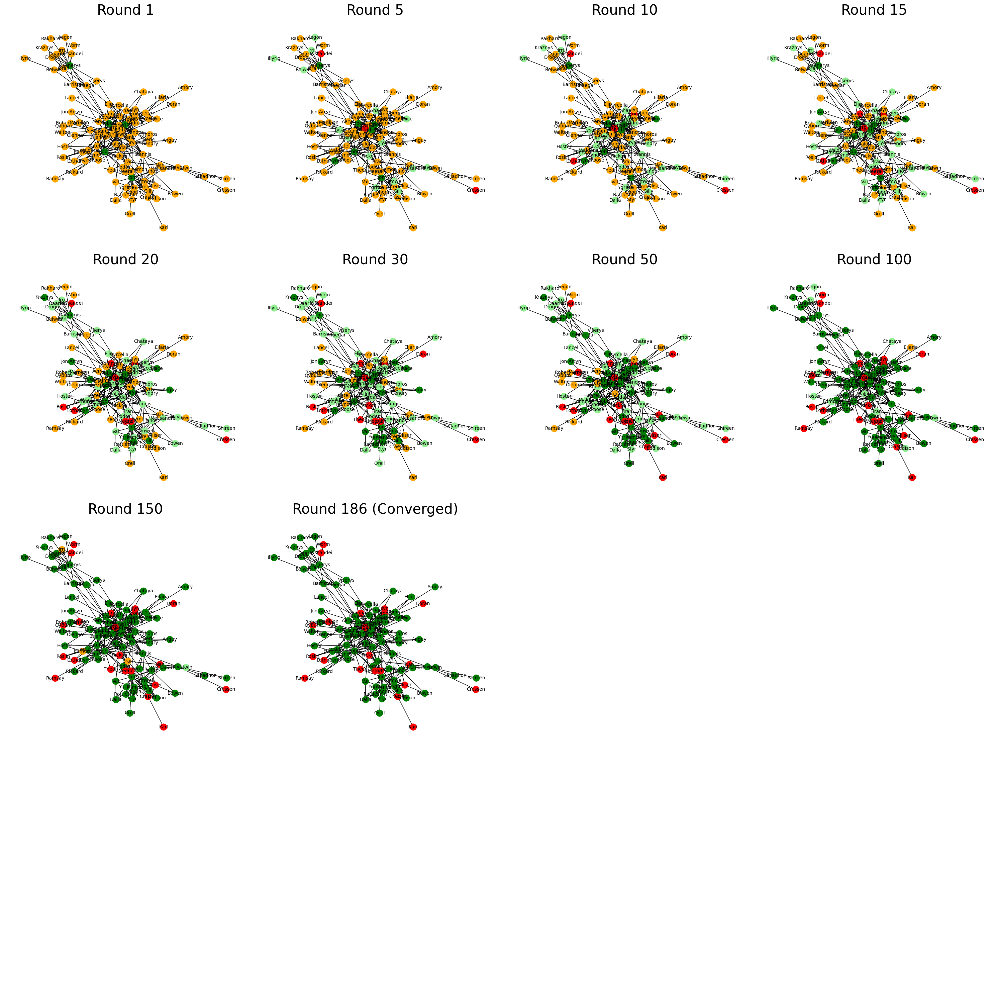

In [41]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random

# Build the graph
G = nx.Graph()

# Add nodes with initial attributes
for _, row in nodes.iterrows():
    G.add_node(row['index'], name=row['name'], category='Non_Believer')

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

# Calculate betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Sort nodes by betweenness centrality (descending order)
sorted_nodes_by_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 nodes based on betweenness centrality
top_5_nodes = [node[0] for node in sorted_nodes_by_betweenness[:5]]

# Set the top 5 nodes as initial believers
for node in top_5_nodes:
    G.nodes[node]['category'] = 'True_Believer'

# Parameters
true_believer_chance = 0.02  # Chance of becoming True Believer
true_non_believer_chance = 0.01  # Chance of becoming True Non Believer
belief_spread_chance = 0.05 # Small chance to become a believer after influence 
non_belief_spread_chance = 0.01  # Small chance to switch from Believer to Non_Believer (and vice versa)

contagion_simulation_converged(G, belief_spread_chance, non_belief_spread_chance, true_believer_chance, true_non_believer_chance)

In [42]:
# Parameters
true_believer_chance = 0.02  # Chance of becoming True Believer
true_non_believer_chance = 0.01  # Chance of becoming True Non Believer
belief_spread_chance = 0.05 # Small chance to become a believer after influence 
non_belief_spread_chance = 0.01  # Small chance to switch from Believer to Non_Believer (and vice versa)

# Calculate betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Sort nodes by betweenness centrality (descending order)
sorted_nodes_by_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 nodes based on betweenness centrality
top_5_nodes = [node[0] for node in sorted_nodes_by_betweenness[:5]]

def initialize_believers(G):
    for node in top_5_nodes:
        G.nodes[node]['category'] = 'True_Believer'

# Run the function to perform 500 iterations and calculate the average convergence rate
run_multiple_iterations(500)

Average Convergence Rate over 500 iterations: 49.33%
Average True Believers over 500 iterations: 52.78
Average True Non-Believers over 500 iterations: 21.97


### Scenario #2 Gossip

1. Instead of randomly selecting the initial nodes, we use the 5 nodes with the LEAST BETWEEENNES CENTRALITY. We assume them to be an unreliant source. They start as TRUE BELIEVERS.

2. Parameters reflect a "worse" chance in becoming a believer since the source is not well-connected and not trusted.



3. We observe until convergence and view the majority opinion.

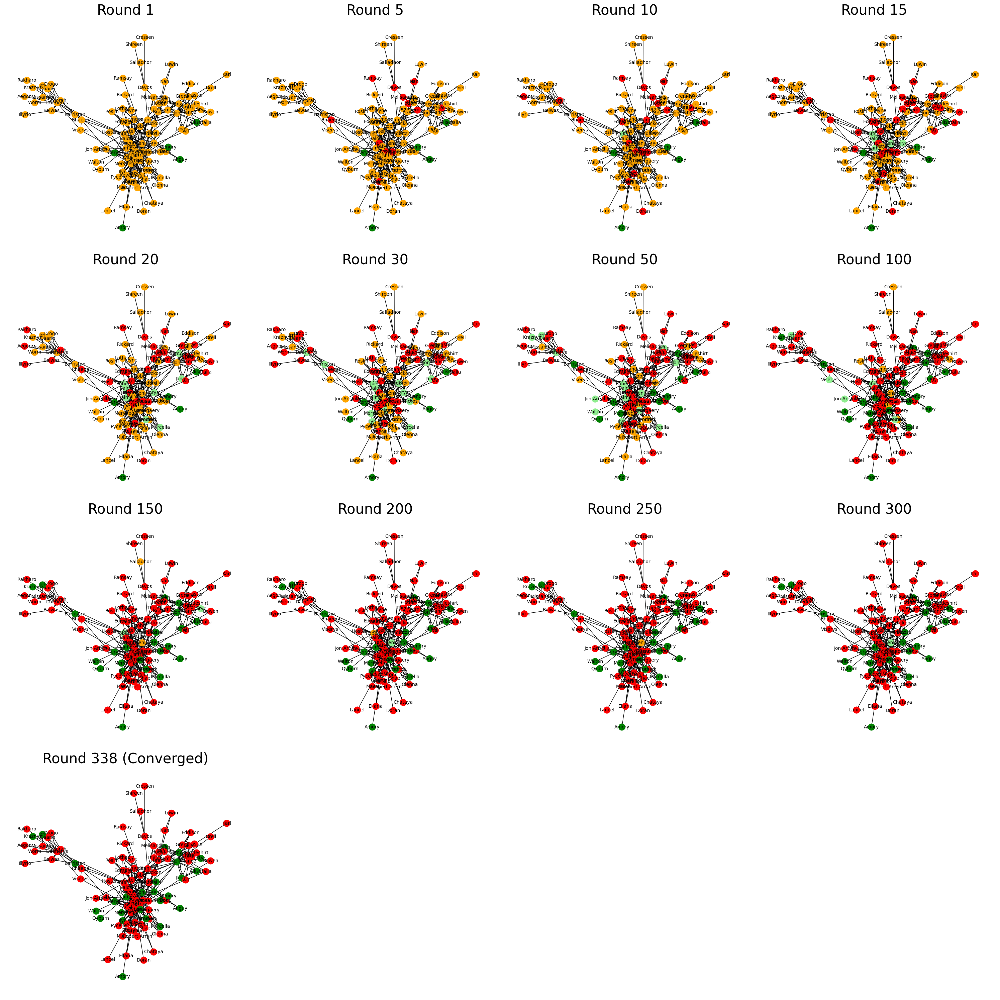

In [43]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random

# Build the graph
G = nx.Graph()

# Add nodes with initial attributes
for _, row in nodes.iterrows():
    G.add_node(row['index'], name=row['name'], category='Non_Believer')

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

# Calculate betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Sort nodes by betweenness centrality (ascending order)
sorted_nodes_by_betweenness = sorted(betweenness.items(), key=lambda x: x[1])

# Get the least central 5 nodes based on betweenness centrality
least_5_nodes = [node[0] for node in sorted_nodes_by_betweenness[:5]]

# Set the least central 5 nodes as initial believers
for node in least_5_nodes:
    G.nodes[node]['category'] = 'True_Believer'

# Parameters
true_believer_chance = 0.015  # Chance of becoming True Believer
true_non_believer_chance = 0.02  # Chance of becoming True Non Believer
belief_spread_chance = 0.035 # Small chance to become a believer after influence 
non_belief_spread_chance = 0.02  # Small chance to switch from Believer to Non_Believer (and vice versa)

contagion_simulation_converged(G, belief_spread_chance, non_belief_spread_chance, true_believer_chance, true_non_believer_chance)

In [44]:
# Parameters
true_believer_chance = 0.015  # Chance of becoming True Believer
true_non_believer_chance = 0.02  # Chance of becoming True Non Believer
belief_spread_chance = 0.035 # Small chance to become a believer after influence 
non_belief_spread_chance = 0.02  # Small chance to switch from Believer to Non_Believer (and vice versa)

# Calculate betweenness centrality for each node
betweenness = nx.betweenness_centrality(G)

# Sort nodes by betweenness centrality (ascending order)
sorted_nodes_by_betweenness = sorted(betweenness.items(), key=lambda x: x[1])

# Get the least central 5 nodes based on betweenness centrality
least_5_nodes = [node[0] for node in sorted_nodes_by_betweenness[:5]]

# Set the least central 5 nodes as initial believers
def initialize_believers(G):
    for node in least_5_nodes:
        G.nodes[node]['category'] = 'True_Believer'

# Run the function to perform 500 iterations and calculate the average convergence rate
run_multiple_iterations(500)

Average Convergence Rate over 500 iterations: 19.04%
Average True Believers over 500 iterations: 20.37
Average True Non-Believers over 500 iterations: 60.25


### Comparison

We can see that the first scenario converges to a majority of "true_believers" while news (or gossip) coming from an untrusted source converges to the majority opinion of "true_non_believer". Below are the parameters used for each scenario.

In [ ]:
"""
Scenario #1
true_believer_chance =       0.020         
true_non_believer_chance =   0.010         
belief_spread_chance =       0.050        
non_belief_spread_chance =   0.010     

Average Convergence Rate over 500 iterations: 41.62%
Average True Believers over 500 iterations: 44.54
Average True Non-Believers over 500 iterations: 26.81

Scenario #2
true_believer_chance =      0.015        
true_non_believer_chance =  0.020         
belief_spread_chance =      0.035        
non_belief_spread_chance =  0.020     

Average Convergence Rate over 500 iterations: 61.47%
Average True Believers over 500 iterations: 65.78
Average True Non-Believers over 500 iterations: 12.80



TRUE BELIEVER chance
    0.020 vs. 0.015         higher for "Trusted Source"

TRUE NON BELIEVER chance
    0.01 vs 0.02            higher for "Unreliant Source"

BELIEVER chance  
    0.050 vs. 0.035         higher for "Trusted Source"

NON BELIEVER chance
    0.01 vs. 0.02           higher for "Unreliant Source"
"""

### Key Insights:
We can see how reliable and highly connected sources gain more traction, while unreliable and scarcely connected sources gain more distrust.

### Time to converge entirely
Out of interest, we will also remove the time restrictions and see how long it takes for the graph to converge and the final Non-Believers to Believers ratio

In [45]:
# Initial believers (seed nodes)
def initialize_believers(G):
    initial_believers = random.sample(list(G.nodes), 5)  # Randomly choose 5 initial believers
    for node in initial_believers:
        G.nodes[node]['category'] = 'Believer'

def run_contagion_simulation_until_convergence(G):
    """
    Runs the contagion simulation until all nodes are in a terminal state (True Believers or True Non-Believers).
    Returns the updated graph and the number of steps it took to reach convergence.
    """
    t = 0
    while True:
        t += 1
        nodes_to_process = list(G.nodes)
        random.shuffle(nodes_to_process)

        # Process each node in random order
        for node in nodes_to_process:
            if G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer']:
                continue

            neighbor_belief_influence = sum(
                G.edges[node, neighbor]['weight']
                for neighbor in G.neighbors(node)
                if G.nodes[neighbor]['category'] in ['Believer', 'True_Believer']
            )

            # Update states
            if neighbor_belief_influence > 0 and G.nodes[node]['category'] == 'Non_Believer':
                if random.random() < belief_spread_chance:
                    G.nodes[node]['category'] = 'Believer'

            if G.nodes[node]['category'] == 'Believer' and random.random() < non_belief_spread_chance:
                G.nodes[node]['category'] = 'Non_Believer'

            if G.nodes[node]['category'] == 'Believer' and random.random() < true_believer_chance:
                G.nodes[node]['category'] = 'True_Believer'
            elif G.nodes[node]['category'] == 'Non_Believer' and random.random() < true_non_believer_chance:
                G.nodes[node]['category'] = 'True_Non_Believer'

        # Check if all nodes are either True Believers or True Non Believers
        all_converged = all(G.nodes[node]['category'] in ['True_Believer', 'True_Non_Believer'] for node in G.nodes)
        if all_converged:
            break

    return G, t  # Return the final graph and the number of steps it took to converge

def run_multiple_iterations(iterations):
    total_steps = 0
    total_true_believers = 0
    total_true_non_believers = 0

    for i in range(iterations):
        # Build a new graph for each iteration
        G = build_graph()
        initialize_believers(G)

        # Run the contagion simulation until convergence
        updated_G, steps = run_contagion_simulation_until_convergence(G)

        # Accumulate the number of steps it took for convergence
        total_steps += steps

        # Calculate the number of True Believers and True Non-Believers at the end of the iteration
        true_believers = sum(1 for node in updated_G.nodes if updated_G.nodes[node]['category'] == 'True_Believer')
        true_non_believers = sum(1 for node in updated_G.nodes if updated_G.nodes[node]['category'] == 'True_Non_Believer')

        # Accumulate the counts of True Believers and True Non-Believers
        total_true_believers += true_believers
        total_true_non_believers += true_non_believers

    # Calculate the average number of steps to convergence
    average_steps = total_steps / iterations
    # Calculate the average number of True Believers and True Non-Believers per iteration
    average_true_believers = total_true_believers / iterations
    average_true_non_believers = total_true_non_believers / iterations

    # Print the results
    print(f"Average Steps to Convergence over {iterations} iterations: {average_steps:.2f}")
    print(f"Average True Believers over {iterations} iterations: {average_true_believers:.2f}")
    print(f"Average True Non-Believers over {iterations} iterations: {average_true_non_believers:.2f}")


In [46]:
# Parameters for Base case
true_believer_chance = 0.02
true_non_believer_chance = 0.01
belief_spread_chance = 0.05
non_belief_spread_chance = 0.01

# Run the function to perform 500 iterations and calculate the average steps to convergence
print('Base Case')
run_multiple_iterations(500)


# Parameters for Trusted Source
true_believer_chance = 0.02 
true_non_believer_chance = 0.01 
belief_spread_chance = 0.1 
non_belief_spread_chance = 0.01 
print()
print('Trusted Source')
run_multiple_iterations(500)

# Parameters for Untrusted Source
true_believer_chance = 0.015 
true_non_believer_chance = 0.02 
belief_spread_chance = 0.035
non_belief_spread_chance = 0.02
print()
print('Untrusted Source')
run_multiple_iterations(500)

Base Case
Average Steps to Convergence over 500 iterations: 328.77
Average True Believers over 500 iterations: 73.23
Average True Non-Believers over 500 iterations: 33.77

Trusted Source
Average Steps to Convergence over 500 iterations: 300.45
Average True Believers over 500 iterations: 88.29
Average True Non-Believers over 500 iterations: 18.71

Untrusted Source
Average Steps to Convergence over 500 iterations: 295.68
Average True Believers over 500 iterations: 32.14
Average True Non-Believers over 500 iterations: 74.86


### Results
1. The Base Case shows moderate results across all metrics, with more steps to converge and a balance between True Believers and Non-Believers.
2. The Trusted Source performs better in terms of convergence speed and has a higher proportion of True Believers with a relatively low number of True Non-Believers.
3. The Untrusted Source, while converging relatively quickly, has a high number of True Non-Believers, indicating resistance to its influence. 